# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162521.jpg  
  inflating: processed_celeba_small/celeba/162522.jpg  
  inflating: processed_celeba_small/celeba/162523.jpg  
  inflating: processed_celeba_small/celeba/162524.jpg  
  inflating: processed_celeba_small/celeba/162525.jpg  
  inflating: processed_celeba_small/celeba/162526.jpg  
  inflating: processed_celeba_small/celeba/162527.jpg  
  inflating: processed_celeba_small/celeba/162528.jpg  
  inflating: processed_celeba_small/celeba/162529.jpg  
  inflating: processed_celeba_small/celeba/162530.jpg  
  inflating: processed_celeba_small/celeba/162531.jpg  
  inflating: processed_celeba_small/celeba/162532.jpg  
  inflating: processed_celeba_small/celeba/162533.jpg  
  inflating: processed_celeba_small/celeba/162534.jpg  
  inflating: processed_celeba_small/celeba/162535.jpg  
  inflating: processed_celeba_small/celeba/162536.jpg  
  inflating: processed_celeba_small/celeba/162537.jpg  
  inflating: processed_celeba_small/celeba/16253

  inflating: processed_celeba_small/celeba/163139.jpg  
  inflating: processed_celeba_small/celeba/163140.jpg  
  inflating: processed_celeba_small/celeba/163141.jpg  
  inflating: processed_celeba_small/celeba/163142.jpg  
  inflating: processed_celeba_small/celeba/163143.jpg  
  inflating: processed_celeba_small/celeba/163144.jpg  
  inflating: processed_celeba_small/celeba/163145.jpg  
  inflating: processed_celeba_small/celeba/163146.jpg  
  inflating: processed_celeba_small/celeba/163147.jpg  
  inflating: processed_celeba_small/celeba/163148.jpg  
  inflating: processed_celeba_small/celeba/163149.jpg  
  inflating: processed_celeba_small/celeba/163150.jpg  
  inflating: processed_celeba_small/celeba/163151.jpg  
  inflating: processed_celeba_small/celeba/163152.jpg  
  inflating: processed_celeba_small/celeba/163153.jpg  
  inflating: processed_celeba_small/celeba/163154.jpg  
  inflating: processed_celeba_small/celeba/163155.jpg  
  inflating: processed_celeba_small/celeba/16315

  inflating: processed_celeba_small/celeba/163740.jpg  
  inflating: processed_celeba_small/celeba/163741.jpg  
  inflating: processed_celeba_small/celeba/163742.jpg  
  inflating: processed_celeba_small/celeba/163743.jpg  
  inflating: processed_celeba_small/celeba/163744.jpg  
  inflating: processed_celeba_small/celeba/163745.jpg  
  inflating: processed_celeba_small/celeba/163746.jpg  
  inflating: processed_celeba_small/celeba/163747.jpg  
  inflating: processed_celeba_small/celeba/163748.jpg  
  inflating: processed_celeba_small/celeba/163749.jpg  
  inflating: processed_celeba_small/celeba/163750.jpg  
  inflating: processed_celeba_small/celeba/163751.jpg  
  inflating: processed_celeba_small/celeba/163752.jpg  
  inflating: processed_celeba_small/celeba/163753.jpg  
  inflating: processed_celeba_small/celeba/163754.jpg  
  inflating: processed_celeba_small/celeba/163755.jpg  
  inflating: processed_celeba_small/celeba/163756.jpg  
  inflating: processed_celeba_small/celeba/16375

  inflating: processed_celeba_small/celeba/164357.jpg  
  inflating: processed_celeba_small/celeba/164358.jpg  
  inflating: processed_celeba_small/celeba/164359.jpg  
  inflating: processed_celeba_small/celeba/164360.jpg  
  inflating: processed_celeba_small/celeba/164361.jpg  
  inflating: processed_celeba_small/celeba/164362.jpg  
  inflating: processed_celeba_small/celeba/164363.jpg  
  inflating: processed_celeba_small/celeba/164364.jpg  
  inflating: processed_celeba_small/celeba/164365.jpg  
  inflating: processed_celeba_small/celeba/164366.jpg  
  inflating: processed_celeba_small/celeba/164367.jpg  
  inflating: processed_celeba_small/celeba/164368.jpg  
  inflating: processed_celeba_small/celeba/164369.jpg  
  inflating: processed_celeba_small/celeba/164370.jpg  
  inflating: processed_celeba_small/celeba/164371.jpg  
  inflating: processed_celeba_small/celeba/164372.jpg  
  inflating: processed_celeba_small/celeba/164373.jpg  
  inflating: processed_celeba_small/celeba/16437

  inflating: processed_celeba_small/celeba/164976.jpg  
  inflating: processed_celeba_small/celeba/164977.jpg  
  inflating: processed_celeba_small/celeba/164978.jpg  
  inflating: processed_celeba_small/celeba/164979.jpg  
  inflating: processed_celeba_small/celeba/164980.jpg  
  inflating: processed_celeba_small/celeba/164981.jpg  
  inflating: processed_celeba_small/celeba/164982.jpg  
  inflating: processed_celeba_small/celeba/164983.jpg  
  inflating: processed_celeba_small/celeba/164984.jpg  
  inflating: processed_celeba_small/celeba/164985.jpg  
  inflating: processed_celeba_small/celeba/164986.jpg  
  inflating: processed_celeba_small/celeba/164987.jpg  
  inflating: processed_celeba_small/celeba/164988.jpg  
  inflating: processed_celeba_small/celeba/164989.jpg  
  inflating: processed_celeba_small/celeba/164990.jpg  
  inflating: processed_celeba_small/celeba/164991.jpg  
  inflating: processed_celeba_small/celeba/164992.jpg  
  inflating: processed_celeba_small/celeba/16499

  inflating: processed_celeba_small/celeba/165588.jpg  
  inflating: processed_celeba_small/celeba/165589.jpg  
  inflating: processed_celeba_small/celeba/165590.jpg  
  inflating: processed_celeba_small/celeba/165591.jpg  
  inflating: processed_celeba_small/celeba/165592.jpg  
  inflating: processed_celeba_small/celeba/165593.jpg  
  inflating: processed_celeba_small/celeba/165594.jpg  
  inflating: processed_celeba_small/celeba/165595.jpg  
  inflating: processed_celeba_small/celeba/165596.jpg  
  inflating: processed_celeba_small/celeba/165597.jpg  
  inflating: processed_celeba_small/celeba/165598.jpg  
  inflating: processed_celeba_small/celeba/165599.jpg  
  inflating: processed_celeba_small/celeba/165600.jpg  
  inflating: processed_celeba_small/celeba/165601.jpg  
  inflating: processed_celeba_small/celeba/165602.jpg  
  inflating: processed_celeba_small/celeba/165603.jpg  
  inflating: processed_celeba_small/celeba/165604.jpg  
  inflating: processed_celeba_small/celeba/16560

  inflating: processed_celeba_small/celeba/166211.jpg  
  inflating: processed_celeba_small/celeba/166212.jpg  
  inflating: processed_celeba_small/celeba/166213.jpg  
  inflating: processed_celeba_small/celeba/166214.jpg  
  inflating: processed_celeba_small/celeba/166215.jpg  
  inflating: processed_celeba_small/celeba/166216.jpg  
  inflating: processed_celeba_small/celeba/166217.jpg  
  inflating: processed_celeba_small/celeba/166218.jpg  
  inflating: processed_celeba_small/celeba/166219.jpg  
  inflating: processed_celeba_small/celeba/166220.jpg  
  inflating: processed_celeba_small/celeba/166221.jpg  
  inflating: processed_celeba_small/celeba/166222.jpg  
  inflating: processed_celeba_small/celeba/166223.jpg  
  inflating: processed_celeba_small/celeba/166224.jpg  
  inflating: processed_celeba_small/celeba/166225.jpg  
  inflating: processed_celeba_small/celeba/166226.jpg  
  inflating: processed_celeba_small/celeba/166227.jpg  
  inflating: processed_celeba_small/celeba/16622

  inflating: processed_celeba_small/celeba/166830.jpg  
  inflating: processed_celeba_small/celeba/166831.jpg  
  inflating: processed_celeba_small/celeba/166832.jpg  
  inflating: processed_celeba_small/celeba/166833.jpg  
  inflating: processed_celeba_small/celeba/166834.jpg  
  inflating: processed_celeba_small/celeba/166835.jpg  
  inflating: processed_celeba_small/celeba/166836.jpg  
  inflating: processed_celeba_small/celeba/166837.jpg  
  inflating: processed_celeba_small/celeba/166838.jpg  
  inflating: processed_celeba_small/celeba/166839.jpg  
  inflating: processed_celeba_small/celeba/166840.jpg  
  inflating: processed_celeba_small/celeba/166841.jpg  
  inflating: processed_celeba_small/celeba/166842.jpg  
  inflating: processed_celeba_small/celeba/166843.jpg  
  inflating: processed_celeba_small/celeba/166844.jpg  
  inflating: processed_celeba_small/celeba/166845.jpg  
  inflating: processed_celeba_small/celeba/166846.jpg  
  inflating: processed_celeba_small/celeba/16684

  inflating: processed_celeba_small/celeba/167440.jpg  
  inflating: processed_celeba_small/celeba/167441.jpg  
  inflating: processed_celeba_small/celeba/167442.jpg  
  inflating: processed_celeba_small/celeba/167443.jpg  
  inflating: processed_celeba_small/celeba/167444.jpg  
  inflating: processed_celeba_small/celeba/167445.jpg  
  inflating: processed_celeba_small/celeba/167446.jpg  
  inflating: processed_celeba_small/celeba/167447.jpg  
  inflating: processed_celeba_small/celeba/167448.jpg  
  inflating: processed_celeba_small/celeba/167449.jpg  
  inflating: processed_celeba_small/celeba/167450.jpg  
  inflating: processed_celeba_small/celeba/167451.jpg  
  inflating: processed_celeba_small/celeba/167452.jpg  
  inflating: processed_celeba_small/celeba/167453.jpg  
  inflating: processed_celeba_small/celeba/167454.jpg  
  inflating: processed_celeba_small/celeba/167455.jpg  
  inflating: processed_celeba_small/celeba/167456.jpg  
  inflating: processed_celeba_small/celeba/16745

  inflating: processed_celeba_small/celeba/168050.jpg  
  inflating: processed_celeba_small/celeba/168051.jpg  
  inflating: processed_celeba_small/celeba/168052.jpg  
  inflating: processed_celeba_small/celeba/168053.jpg  
  inflating: processed_celeba_small/celeba/168054.jpg  
  inflating: processed_celeba_small/celeba/168055.jpg  
  inflating: processed_celeba_small/celeba/168056.jpg  
  inflating: processed_celeba_small/celeba/168057.jpg  
  inflating: processed_celeba_small/celeba/168058.jpg  
  inflating: processed_celeba_small/celeba/168059.jpg  
  inflating: processed_celeba_small/celeba/168060.jpg  
  inflating: processed_celeba_small/celeba/168061.jpg  
  inflating: processed_celeba_small/celeba/168062.jpg  
  inflating: processed_celeba_small/celeba/168063.jpg  
  inflating: processed_celeba_small/celeba/168064.jpg  
  inflating: processed_celeba_small/celeba/168065.jpg  
  inflating: processed_celeba_small/celeba/168066.jpg  
  inflating: processed_celeba_small/celeba/16806

  inflating: processed_celeba_small/celeba/168645.jpg  
  inflating: processed_celeba_small/celeba/168646.jpg  
  inflating: processed_celeba_small/celeba/168647.jpg  
  inflating: processed_celeba_small/celeba/168648.jpg  
  inflating: processed_celeba_small/celeba/168649.jpg  
  inflating: processed_celeba_small/celeba/168650.jpg  
  inflating: processed_celeba_small/celeba/168651.jpg  
  inflating: processed_celeba_small/celeba/168652.jpg  
  inflating: processed_celeba_small/celeba/168653.jpg  
  inflating: processed_celeba_small/celeba/168654.jpg  
  inflating: processed_celeba_small/celeba/168655.jpg  
  inflating: processed_celeba_small/celeba/168656.jpg  
  inflating: processed_celeba_small/celeba/168657.jpg  
  inflating: processed_celeba_small/celeba/168658.jpg  
  inflating: processed_celeba_small/celeba/168659.jpg  
  inflating: processed_celeba_small/celeba/168660.jpg  
  inflating: processed_celeba_small/celeba/168661.jpg  
  inflating: processed_celeba_small/celeba/16866

  inflating: processed_celeba_small/celeba/169237.jpg  
  inflating: processed_celeba_small/celeba/169238.jpg  
  inflating: processed_celeba_small/celeba/169239.jpg  
  inflating: processed_celeba_small/celeba/169240.jpg  
  inflating: processed_celeba_small/celeba/169241.jpg  
  inflating: processed_celeba_small/celeba/169242.jpg  
  inflating: processed_celeba_small/celeba/169243.jpg  
  inflating: processed_celeba_small/celeba/169244.jpg  
  inflating: processed_celeba_small/celeba/169245.jpg  
  inflating: processed_celeba_small/celeba/169246.jpg  
  inflating: processed_celeba_small/celeba/169247.jpg  
  inflating: processed_celeba_small/celeba/169248.jpg  
  inflating: processed_celeba_small/celeba/169249.jpg  
  inflating: processed_celeba_small/celeba/169250.jpg  
  inflating: processed_celeba_small/celeba/169251.jpg  
  inflating: processed_celeba_small/celeba/169252.jpg  
  inflating: processed_celeba_small/celeba/169253.jpg  
  inflating: processed_celeba_small/celeba/16925

  inflating: processed_celeba_small/celeba/169848.jpg  
  inflating: processed_celeba_small/celeba/169849.jpg  
  inflating: processed_celeba_small/celeba/169850.jpg  
  inflating: processed_celeba_small/celeba/169851.jpg  
  inflating: processed_celeba_small/celeba/169852.jpg  
  inflating: processed_celeba_small/celeba/169853.jpg  
  inflating: processed_celeba_small/celeba/169854.jpg  
  inflating: processed_celeba_small/celeba/169855.jpg  
  inflating: processed_celeba_small/celeba/169856.jpg  
  inflating: processed_celeba_small/celeba/169857.jpg  
  inflating: processed_celeba_small/celeba/169858.jpg  
  inflating: processed_celeba_small/celeba/169859.jpg  
  inflating: processed_celeba_small/celeba/169860.jpg  
  inflating: processed_celeba_small/celeba/169861.jpg  
  inflating: processed_celeba_small/celeba/169862.jpg  
  inflating: processed_celeba_small/celeba/169863.jpg  
  inflating: processed_celeba_small/celeba/169864.jpg  
  inflating: processed_celeba_small/celeba/16986

  inflating: processed_celeba_small/celeba/170186.jpg  
  inflating: processed_celeba_small/celeba/170187.jpg  
  inflating: processed_celeba_small/celeba/170188.jpg  
  inflating: processed_celeba_small/celeba/170189.jpg  
  inflating: processed_celeba_small/celeba/170190.jpg  
  inflating: processed_celeba_small/celeba/170191.jpg  
  inflating: processed_celeba_small/celeba/170192.jpg  
  inflating: processed_celeba_small/celeba/170193.jpg  
  inflating: processed_celeba_small/celeba/170194.jpg  
  inflating: processed_celeba_small/celeba/170195.jpg  
  inflating: processed_celeba_small/celeba/170196.jpg  
  inflating: processed_celeba_small/celeba/170197.jpg  
  inflating: processed_celeba_small/celeba/170198.jpg  
  inflating: processed_celeba_small/celeba/170199.jpg  
  inflating: processed_celeba_small/celeba/170200.jpg  
  inflating: processed_celeba_small/celeba/170201.jpg  
  inflating: processed_celeba_small/celeba/170202.jpg  
  inflating: processed_celeba_small/celeba/17020

  inflating: processed_celeba_small/celeba/170699.jpg  
  inflating: processed_celeba_small/celeba/170700.jpg  
  inflating: processed_celeba_small/celeba/170701.jpg  
  inflating: processed_celeba_small/celeba/170702.jpg  
  inflating: processed_celeba_small/celeba/170703.jpg  
  inflating: processed_celeba_small/celeba/170704.jpg  
  inflating: processed_celeba_small/celeba/170705.jpg  
  inflating: processed_celeba_small/celeba/170706.jpg  
  inflating: processed_celeba_small/celeba/170707.jpg  
  inflating: processed_celeba_small/celeba/170708.jpg  
  inflating: processed_celeba_small/celeba/170709.jpg  
  inflating: processed_celeba_small/celeba/170710.jpg  
  inflating: processed_celeba_small/celeba/170711.jpg  
  inflating: processed_celeba_small/celeba/170712.jpg  
  inflating: processed_celeba_small/celeba/170713.jpg  
  inflating: processed_celeba_small/celeba/170714.jpg  
  inflating: processed_celeba_small/celeba/170715.jpg  
  inflating: processed_celeba_small/celeba/17071

  inflating: processed_celeba_small/celeba/171316.jpg  
  inflating: processed_celeba_small/celeba/171317.jpg  
  inflating: processed_celeba_small/celeba/171318.jpg  
  inflating: processed_celeba_small/celeba/171319.jpg  
  inflating: processed_celeba_small/celeba/171320.jpg  
  inflating: processed_celeba_small/celeba/171321.jpg  
  inflating: processed_celeba_small/celeba/171322.jpg  
  inflating: processed_celeba_small/celeba/171323.jpg  
  inflating: processed_celeba_small/celeba/171324.jpg  
  inflating: processed_celeba_small/celeba/171325.jpg  
  inflating: processed_celeba_small/celeba/171326.jpg  
  inflating: processed_celeba_small/celeba/171327.jpg  
  inflating: processed_celeba_small/celeba/171328.jpg  
  inflating: processed_celeba_small/celeba/171329.jpg  
  inflating: processed_celeba_small/celeba/171330.jpg  
  inflating: processed_celeba_small/celeba/171331.jpg  
  inflating: processed_celeba_small/celeba/171332.jpg  
  inflating: processed_celeba_small/celeba/17133

  inflating: processed_celeba_small/celeba/171933.jpg  
  inflating: processed_celeba_small/celeba/171934.jpg  
  inflating: processed_celeba_small/celeba/171935.jpg  
  inflating: processed_celeba_small/celeba/171936.jpg  
  inflating: processed_celeba_small/celeba/171937.jpg  
  inflating: processed_celeba_small/celeba/171938.jpg  
  inflating: processed_celeba_small/celeba/171939.jpg  
  inflating: processed_celeba_small/celeba/171940.jpg  
  inflating: processed_celeba_small/celeba/171941.jpg  
  inflating: processed_celeba_small/celeba/171942.jpg  
  inflating: processed_celeba_small/celeba/171943.jpg  
  inflating: processed_celeba_small/celeba/171944.jpg  
  inflating: processed_celeba_small/celeba/171945.jpg  
  inflating: processed_celeba_small/celeba/171946.jpg  
  inflating: processed_celeba_small/celeba/171947.jpg  
  inflating: processed_celeba_small/celeba/171948.jpg  
  inflating: processed_celeba_small/celeba/171949.jpg  
  inflating: processed_celeba_small/celeba/17195

  inflating: processed_celeba_small/celeba/172547.jpg  
  inflating: processed_celeba_small/celeba/172548.jpg  
  inflating: processed_celeba_small/celeba/172549.jpg  
  inflating: processed_celeba_small/celeba/172550.jpg  
  inflating: processed_celeba_small/celeba/172551.jpg  
  inflating: processed_celeba_small/celeba/172552.jpg  
  inflating: processed_celeba_small/celeba/172553.jpg  
  inflating: processed_celeba_small/celeba/172554.jpg  
  inflating: processed_celeba_small/celeba/172555.jpg  
  inflating: processed_celeba_small/celeba/172556.jpg  
  inflating: processed_celeba_small/celeba/172557.jpg  
  inflating: processed_celeba_small/celeba/172558.jpg  
  inflating: processed_celeba_small/celeba/172559.jpg  
  inflating: processed_celeba_small/celeba/172560.jpg  
  inflating: processed_celeba_small/celeba/172561.jpg  
  inflating: processed_celeba_small/celeba/172562.jpg  
  inflating: processed_celeba_small/celeba/172563.jpg  
  inflating: processed_celeba_small/celeba/17256

  inflating: processed_celeba_small/celeba/173161.jpg  
  inflating: processed_celeba_small/celeba/173162.jpg  
  inflating: processed_celeba_small/celeba/173163.jpg  
  inflating: processed_celeba_small/celeba/173164.jpg  
  inflating: processed_celeba_small/celeba/173165.jpg  
  inflating: processed_celeba_small/celeba/173166.jpg  
  inflating: processed_celeba_small/celeba/173167.jpg  
  inflating: processed_celeba_small/celeba/173168.jpg  
  inflating: processed_celeba_small/celeba/173169.jpg  
  inflating: processed_celeba_small/celeba/173170.jpg  
  inflating: processed_celeba_small/celeba/173171.jpg  
  inflating: processed_celeba_small/celeba/173172.jpg  
  inflating: processed_celeba_small/celeba/173173.jpg  
  inflating: processed_celeba_small/celeba/173174.jpg  
  inflating: processed_celeba_small/celeba/173175.jpg  
  inflating: processed_celeba_small/celeba/173176.jpg  
  inflating: processed_celeba_small/celeba/173177.jpg  
  inflating: processed_celeba_small/celeba/17317

  inflating: processed_celeba_small/celeba/173767.jpg  
  inflating: processed_celeba_small/celeba/173768.jpg  
  inflating: processed_celeba_small/celeba/173769.jpg  
  inflating: processed_celeba_small/celeba/173770.jpg  
  inflating: processed_celeba_small/celeba/173771.jpg  
  inflating: processed_celeba_small/celeba/173772.jpg  
  inflating: processed_celeba_small/celeba/173773.jpg  
  inflating: processed_celeba_small/celeba/173774.jpg  
  inflating: processed_celeba_small/celeba/173775.jpg  
  inflating: processed_celeba_small/celeba/173776.jpg  
  inflating: processed_celeba_small/celeba/173777.jpg  
  inflating: processed_celeba_small/celeba/173778.jpg  
  inflating: processed_celeba_small/celeba/173779.jpg  
  inflating: processed_celeba_small/celeba/173780.jpg  
  inflating: processed_celeba_small/celeba/173781.jpg  
  inflating: processed_celeba_small/celeba/173782.jpg  
  inflating: processed_celeba_small/celeba/173783.jpg  
  inflating: processed_celeba_small/celeba/17378

  inflating: processed_celeba_small/celeba/174377.jpg  
  inflating: processed_celeba_small/celeba/174378.jpg  
  inflating: processed_celeba_small/celeba/174379.jpg  
  inflating: processed_celeba_small/celeba/174380.jpg  
  inflating: processed_celeba_small/celeba/174381.jpg  
  inflating: processed_celeba_small/celeba/174382.jpg  
  inflating: processed_celeba_small/celeba/174383.jpg  
  inflating: processed_celeba_small/celeba/174384.jpg  
  inflating: processed_celeba_small/celeba/174385.jpg  
  inflating: processed_celeba_small/celeba/174386.jpg  
  inflating: processed_celeba_small/celeba/174387.jpg  
  inflating: processed_celeba_small/celeba/174388.jpg  
  inflating: processed_celeba_small/celeba/174389.jpg  
  inflating: processed_celeba_small/celeba/174390.jpg  
  inflating: processed_celeba_small/celeba/174391.jpg  
  inflating: processed_celeba_small/celeba/174392.jpg  
  inflating: processed_celeba_small/celeba/174393.jpg  
  inflating: processed_celeba_small/celeba/17439

  inflating: processed_celeba_small/celeba/174976.jpg  
  inflating: processed_celeba_small/celeba/174977.jpg  
  inflating: processed_celeba_small/celeba/174978.jpg  
  inflating: processed_celeba_small/celeba/174979.jpg  
  inflating: processed_celeba_small/celeba/174980.jpg  
  inflating: processed_celeba_small/celeba/174981.jpg  
  inflating: processed_celeba_small/celeba/174982.jpg  
  inflating: processed_celeba_small/celeba/174983.jpg  
  inflating: processed_celeba_small/celeba/174984.jpg  
  inflating: processed_celeba_small/celeba/174985.jpg  
  inflating: processed_celeba_small/celeba/174986.jpg  
  inflating: processed_celeba_small/celeba/174987.jpg  
  inflating: processed_celeba_small/celeba/174988.jpg  
  inflating: processed_celeba_small/celeba/174989.jpg  
  inflating: processed_celeba_small/celeba/174990.jpg  
  inflating: processed_celeba_small/celeba/174991.jpg  
  inflating: processed_celeba_small/celeba/174992.jpg  
  inflating: processed_celeba_small/celeba/17499

  inflating: processed_celeba_small/celeba/175586.jpg  
  inflating: processed_celeba_small/celeba/175587.jpg  
  inflating: processed_celeba_small/celeba/175588.jpg  
  inflating: processed_celeba_small/celeba/175589.jpg  
  inflating: processed_celeba_small/celeba/175590.jpg  
  inflating: processed_celeba_small/celeba/175591.jpg  
  inflating: processed_celeba_small/celeba/175592.jpg  
  inflating: processed_celeba_small/celeba/175593.jpg  
  inflating: processed_celeba_small/celeba/175594.jpg  
  inflating: processed_celeba_small/celeba/175595.jpg  
  inflating: processed_celeba_small/celeba/175596.jpg  
  inflating: processed_celeba_small/celeba/175597.jpg  
  inflating: processed_celeba_small/celeba/175598.jpg  
  inflating: processed_celeba_small/celeba/175599.jpg  
  inflating: processed_celeba_small/celeba/175600.jpg  
  inflating: processed_celeba_small/celeba/175601.jpg  
  inflating: processed_celeba_small/celeba/175602.jpg  
  inflating: processed_celeba_small/celeba/17560

  inflating: processed_celeba_small/celeba/176170.jpg  
  inflating: processed_celeba_small/celeba/176171.jpg  
  inflating: processed_celeba_small/celeba/176172.jpg  
  inflating: processed_celeba_small/celeba/176173.jpg  
  inflating: processed_celeba_small/celeba/176174.jpg  
  inflating: processed_celeba_small/celeba/176175.jpg  
  inflating: processed_celeba_small/celeba/176176.jpg  
  inflating: processed_celeba_small/celeba/176177.jpg  
  inflating: processed_celeba_small/celeba/176178.jpg  
  inflating: processed_celeba_small/celeba/176179.jpg  
  inflating: processed_celeba_small/celeba/176180.jpg  
  inflating: processed_celeba_small/celeba/176181.jpg  
  inflating: processed_celeba_small/celeba/176182.jpg  
  inflating: processed_celeba_small/celeba/176183.jpg  
  inflating: processed_celeba_small/celeba/176184.jpg  
  inflating: processed_celeba_small/celeba/176185.jpg  
  inflating: processed_celeba_small/celeba/176186.jpg  
  inflating: processed_celeba_small/celeba/17618

  inflating: processed_celeba_small/celeba/176745.jpg  
  inflating: processed_celeba_small/celeba/176746.jpg  
  inflating: processed_celeba_small/celeba/176747.jpg  
  inflating: processed_celeba_small/celeba/176748.jpg  
  inflating: processed_celeba_small/celeba/176749.jpg  
  inflating: processed_celeba_small/celeba/176750.jpg  
  inflating: processed_celeba_small/celeba/176751.jpg  
  inflating: processed_celeba_small/celeba/176752.jpg  
  inflating: processed_celeba_small/celeba/176753.jpg  
  inflating: processed_celeba_small/celeba/176754.jpg  
  inflating: processed_celeba_small/celeba/176755.jpg  
  inflating: processed_celeba_small/celeba/176756.jpg  
  inflating: processed_celeba_small/celeba/176757.jpg  
  inflating: processed_celeba_small/celeba/176758.jpg  
  inflating: processed_celeba_small/celeba/176759.jpg  
  inflating: processed_celeba_small/celeba/176760.jpg  
  inflating: processed_celeba_small/celeba/176761.jpg  
  inflating: processed_celeba_small/celeba/17676

  inflating: processed_celeba_small/celeba/177325.jpg  
  inflating: processed_celeba_small/celeba/177326.jpg  
  inflating: processed_celeba_small/celeba/177327.jpg  
  inflating: processed_celeba_small/celeba/177328.jpg  
  inflating: processed_celeba_small/celeba/177329.jpg  
  inflating: processed_celeba_small/celeba/177330.jpg  
  inflating: processed_celeba_small/celeba/177331.jpg  
  inflating: processed_celeba_small/celeba/177332.jpg  
  inflating: processed_celeba_small/celeba/177333.jpg  
  inflating: processed_celeba_small/celeba/177334.jpg  
  inflating: processed_celeba_small/celeba/177335.jpg  
  inflating: processed_celeba_small/celeba/177336.jpg  
  inflating: processed_celeba_small/celeba/177337.jpg  
  inflating: processed_celeba_small/celeba/177338.jpg  
  inflating: processed_celeba_small/celeba/177339.jpg  
  inflating: processed_celeba_small/celeba/177340.jpg  
  inflating: processed_celeba_small/celeba/177341.jpg  
  inflating: processed_celeba_small/celeba/17734

  inflating: processed_celeba_small/celeba/177915.jpg  
  inflating: processed_celeba_small/celeba/177916.jpg  
  inflating: processed_celeba_small/celeba/177917.jpg  
  inflating: processed_celeba_small/celeba/177918.jpg  
  inflating: processed_celeba_small/celeba/177919.jpg  
  inflating: processed_celeba_small/celeba/177920.jpg  
  inflating: processed_celeba_small/celeba/177921.jpg  
  inflating: processed_celeba_small/celeba/177922.jpg  
  inflating: processed_celeba_small/celeba/177923.jpg  
  inflating: processed_celeba_small/celeba/177924.jpg  
  inflating: processed_celeba_small/celeba/177925.jpg  
  inflating: processed_celeba_small/celeba/177926.jpg  
  inflating: processed_celeba_small/celeba/177927.jpg  
  inflating: processed_celeba_small/celeba/177928.jpg  
  inflating: processed_celeba_small/celeba/177929.jpg  
  inflating: processed_celeba_small/celeba/177930.jpg  
  inflating: processed_celeba_small/celeba/177931.jpg  
  inflating: processed_celeba_small/celeba/17793

  inflating: processed_celeba_small/celeba/178481.jpg  
  inflating: processed_celeba_small/celeba/178482.jpg  
  inflating: processed_celeba_small/celeba/178483.jpg  
  inflating: processed_celeba_small/celeba/178484.jpg  
  inflating: processed_celeba_small/celeba/178485.jpg  
  inflating: processed_celeba_small/celeba/178486.jpg  
  inflating: processed_celeba_small/celeba/178487.jpg  
  inflating: processed_celeba_small/celeba/178488.jpg  
  inflating: processed_celeba_small/celeba/178489.jpg  
  inflating: processed_celeba_small/celeba/178490.jpg  
  inflating: processed_celeba_small/celeba/178491.jpg  
  inflating: processed_celeba_small/celeba/178492.jpg  
  inflating: processed_celeba_small/celeba/178493.jpg  
  inflating: processed_celeba_small/celeba/178494.jpg  
  inflating: processed_celeba_small/celeba/178495.jpg  
  inflating: processed_celeba_small/celeba/178496.jpg  
  inflating: processed_celeba_small/celeba/178497.jpg  
  inflating: processed_celeba_small/celeba/17849

  inflating: processed_celeba_small/celeba/179090.jpg  
  inflating: processed_celeba_small/celeba/179091.jpg  
  inflating: processed_celeba_small/celeba/179092.jpg  
  inflating: processed_celeba_small/celeba/179093.jpg  
  inflating: processed_celeba_small/celeba/179094.jpg  
  inflating: processed_celeba_small/celeba/179095.jpg  
  inflating: processed_celeba_small/celeba/179096.jpg  
  inflating: processed_celeba_small/celeba/179097.jpg  
  inflating: processed_celeba_small/celeba/179098.jpg  
  inflating: processed_celeba_small/celeba/179099.jpg  
  inflating: processed_celeba_small/celeba/179100.jpg  
  inflating: processed_celeba_small/celeba/179101.jpg  
  inflating: processed_celeba_small/celeba/179102.jpg  
  inflating: processed_celeba_small/celeba/179103.jpg  
  inflating: processed_celeba_small/celeba/179104.jpg  
  inflating: processed_celeba_small/celeba/179105.jpg  
  inflating: processed_celeba_small/celeba/179106.jpg  
  inflating: processed_celeba_small/celeba/17910

  inflating: processed_celeba_small/celeba/179704.jpg  
  inflating: processed_celeba_small/celeba/179705.jpg  
  inflating: processed_celeba_small/celeba/179706.jpg  
  inflating: processed_celeba_small/celeba/179707.jpg  
  inflating: processed_celeba_small/celeba/179708.jpg  
  inflating: processed_celeba_small/celeba/179709.jpg  
  inflating: processed_celeba_small/celeba/179710.jpg  
  inflating: processed_celeba_small/celeba/179711.jpg  
  inflating: processed_celeba_small/celeba/179712.jpg  
  inflating: processed_celeba_small/celeba/179713.jpg  
  inflating: processed_celeba_small/celeba/179714.jpg  
  inflating: processed_celeba_small/celeba/179715.jpg  
  inflating: processed_celeba_small/celeba/179716.jpg  
  inflating: processed_celeba_small/celeba/179717.jpg  
  inflating: processed_celeba_small/celeba/179718.jpg  
  inflating: processed_celeba_small/celeba/179719.jpg  
  inflating: processed_celeba_small/celeba/179720.jpg  
  inflating: processed_celeba_small/celeba/17972

  inflating: processed_celeba_small/celeba/180320.jpg  
  inflating: processed_celeba_small/celeba/180321.jpg  
  inflating: processed_celeba_small/celeba/180322.jpg  
  inflating: processed_celeba_small/celeba/180323.jpg  
  inflating: processed_celeba_small/celeba/180324.jpg  
  inflating: processed_celeba_small/celeba/180325.jpg  
  inflating: processed_celeba_small/celeba/180326.jpg  
  inflating: processed_celeba_small/celeba/180327.jpg  
  inflating: processed_celeba_small/celeba/180328.jpg  
  inflating: processed_celeba_small/celeba/180329.jpg  
  inflating: processed_celeba_small/celeba/180330.jpg  
  inflating: processed_celeba_small/celeba/180331.jpg  
  inflating: processed_celeba_small/celeba/180332.jpg  
  inflating: processed_celeba_small/celeba/180333.jpg  
  inflating: processed_celeba_small/celeba/180334.jpg  
  inflating: processed_celeba_small/celeba/180335.jpg  
  inflating: processed_celeba_small/celeba/180336.jpg  
  inflating: processed_celeba_small/celeba/18033

  inflating: processed_celeba_small/celeba/180932.jpg  
  inflating: processed_celeba_small/celeba/180933.jpg  
  inflating: processed_celeba_small/celeba/180934.jpg  
  inflating: processed_celeba_small/celeba/180935.jpg  
  inflating: processed_celeba_small/celeba/180936.jpg  
  inflating: processed_celeba_small/celeba/180937.jpg  
  inflating: processed_celeba_small/celeba/180938.jpg  
  inflating: processed_celeba_small/celeba/180939.jpg  
  inflating: processed_celeba_small/celeba/180940.jpg  
  inflating: processed_celeba_small/celeba/180941.jpg  
  inflating: processed_celeba_small/celeba/180942.jpg  
  inflating: processed_celeba_small/celeba/180943.jpg  
  inflating: processed_celeba_small/celeba/180944.jpg  
  inflating: processed_celeba_small/celeba/180945.jpg  
  inflating: processed_celeba_small/celeba/180946.jpg  
  inflating: processed_celeba_small/celeba/180947.jpg  
  inflating: processed_celeba_small/celeba/180948.jpg  
  inflating: processed_celeba_small/celeba/18094

  inflating: processed_celeba_small/celeba/181512.jpg  
  inflating: processed_celeba_small/celeba/181513.jpg  
  inflating: processed_celeba_small/celeba/181514.jpg  
  inflating: processed_celeba_small/celeba/181515.jpg  
  inflating: processed_celeba_small/celeba/181516.jpg  
  inflating: processed_celeba_small/celeba/181517.jpg  
  inflating: processed_celeba_small/celeba/181518.jpg  
  inflating: processed_celeba_small/celeba/181519.jpg  
  inflating: processed_celeba_small/celeba/181520.jpg  
  inflating: processed_celeba_small/celeba/181521.jpg  
  inflating: processed_celeba_small/celeba/181522.jpg  
  inflating: processed_celeba_small/celeba/181523.jpg  
  inflating: processed_celeba_small/celeba/181524.jpg  
  inflating: processed_celeba_small/celeba/181525.jpg  
  inflating: processed_celeba_small/celeba/181526.jpg  
  inflating: processed_celeba_small/celeba/181527.jpg  
  inflating: processed_celeba_small/celeba/181528.jpg  
  inflating: processed_celeba_small/celeba/18152

  inflating: processed_celeba_small/celeba/181771.jpg  
  inflating: processed_celeba_small/celeba/181772.jpg  
  inflating: processed_celeba_small/celeba/181773.jpg  
  inflating: processed_celeba_small/celeba/181774.jpg  
  inflating: processed_celeba_small/celeba/181775.jpg  
  inflating: processed_celeba_small/celeba/181776.jpg  
  inflating: processed_celeba_small/celeba/181777.jpg  
  inflating: processed_celeba_small/celeba/181778.jpg  
  inflating: processed_celeba_small/celeba/181779.jpg  
  inflating: processed_celeba_small/celeba/181780.jpg  
  inflating: processed_celeba_small/celeba/181781.jpg  
  inflating: processed_celeba_small/celeba/181782.jpg  
  inflating: processed_celeba_small/celeba/181783.jpg  
  inflating: processed_celeba_small/celeba/181784.jpg  
  inflating: processed_celeba_small/celeba/181785.jpg  
  inflating: processed_celeba_small/celeba/181786.jpg  
  inflating: processed_celeba_small/celeba/181787.jpg  
  inflating: processed_celeba_small/celeba/18178

  inflating: processed_celeba_small/celeba/182386.jpg  
  inflating: processed_celeba_small/celeba/182387.jpg  
  inflating: processed_celeba_small/celeba/182388.jpg  
  inflating: processed_celeba_small/celeba/182389.jpg  
  inflating: processed_celeba_small/celeba/182390.jpg  
  inflating: processed_celeba_small/celeba/182391.jpg  
  inflating: processed_celeba_small/celeba/182392.jpg  
  inflating: processed_celeba_small/celeba/182393.jpg  
  inflating: processed_celeba_small/celeba/182394.jpg  
  inflating: processed_celeba_small/celeba/182395.jpg  
  inflating: processed_celeba_small/celeba/182396.jpg  
  inflating: processed_celeba_small/celeba/182397.jpg  
  inflating: processed_celeba_small/celeba/182398.jpg  
  inflating: processed_celeba_small/celeba/182399.jpg  
  inflating: processed_celeba_small/celeba/182400.jpg  
  inflating: processed_celeba_small/celeba/182401.jpg  
  inflating: processed_celeba_small/celeba/182402.jpg  
  inflating: processed_celeba_small/celeba/18240

  inflating: processed_celeba_small/celeba/182998.jpg  
  inflating: processed_celeba_small/celeba/182999.jpg  
  inflating: processed_celeba_small/celeba/183000.jpg  
  inflating: processed_celeba_small/celeba/183001.jpg  
  inflating: processed_celeba_small/celeba/183002.jpg  
  inflating: processed_celeba_small/celeba/183003.jpg  
  inflating: processed_celeba_small/celeba/183004.jpg  
  inflating: processed_celeba_small/celeba/183005.jpg  
  inflating: processed_celeba_small/celeba/183006.jpg  
  inflating: processed_celeba_small/celeba/183007.jpg  
  inflating: processed_celeba_small/celeba/183008.jpg  
  inflating: processed_celeba_small/celeba/183009.jpg  
  inflating: processed_celeba_small/celeba/183010.jpg  
  inflating: processed_celeba_small/celeba/183011.jpg  
  inflating: processed_celeba_small/celeba/183012.jpg  
  inflating: processed_celeba_small/celeba/183013.jpg  
  inflating: processed_celeba_small/celeba/183014.jpg  
  inflating: processed_celeba_small/celeba/18301

  inflating: processed_celeba_small/celeba/183611.jpg  
  inflating: processed_celeba_small/celeba/183612.jpg  
  inflating: processed_celeba_small/celeba/183613.jpg  
  inflating: processed_celeba_small/celeba/183614.jpg  
  inflating: processed_celeba_small/celeba/183615.jpg  
  inflating: processed_celeba_small/celeba/183616.jpg  
  inflating: processed_celeba_small/celeba/183617.jpg  
  inflating: processed_celeba_small/celeba/183618.jpg  
  inflating: processed_celeba_small/celeba/183619.jpg  
  inflating: processed_celeba_small/celeba/183620.jpg  
  inflating: processed_celeba_small/celeba/183621.jpg  
  inflating: processed_celeba_small/celeba/183622.jpg  
  inflating: processed_celeba_small/celeba/183623.jpg  
  inflating: processed_celeba_small/celeba/183624.jpg  
  inflating: processed_celeba_small/celeba/183625.jpg  
  inflating: processed_celeba_small/celeba/183626.jpg  
  inflating: processed_celeba_small/celeba/183627.jpg  
  inflating: processed_celeba_small/celeba/18362

  inflating: processed_celeba_small/celeba/184222.jpg  
  inflating: processed_celeba_small/celeba/184223.jpg  
  inflating: processed_celeba_small/celeba/184224.jpg  
  inflating: processed_celeba_small/celeba/184225.jpg  
  inflating: processed_celeba_small/celeba/184226.jpg  
  inflating: processed_celeba_small/celeba/184227.jpg  
  inflating: processed_celeba_small/celeba/184228.jpg  
  inflating: processed_celeba_small/celeba/184229.jpg  
  inflating: processed_celeba_small/celeba/184230.jpg  
  inflating: processed_celeba_small/celeba/184231.jpg  
  inflating: processed_celeba_small/celeba/184232.jpg  
  inflating: processed_celeba_small/celeba/184233.jpg  
  inflating: processed_celeba_small/celeba/184234.jpg  
  inflating: processed_celeba_small/celeba/184235.jpg  
  inflating: processed_celeba_small/celeba/184236.jpg  
  inflating: processed_celeba_small/celeba/184237.jpg  
  inflating: processed_celeba_small/celeba/184238.jpg  
  inflating: processed_celeba_small/celeba/18423

  inflating: processed_celeba_small/celeba/184835.jpg  
  inflating: processed_celeba_small/celeba/184836.jpg  
  inflating: processed_celeba_small/celeba/184837.jpg  
  inflating: processed_celeba_small/celeba/184838.jpg  
  inflating: processed_celeba_small/celeba/184839.jpg  
  inflating: processed_celeba_small/celeba/184840.jpg  
  inflating: processed_celeba_small/celeba/184841.jpg  
  inflating: processed_celeba_small/celeba/184842.jpg  
  inflating: processed_celeba_small/celeba/184843.jpg  
  inflating: processed_celeba_small/celeba/184844.jpg  
  inflating: processed_celeba_small/celeba/184845.jpg  
  inflating: processed_celeba_small/celeba/184846.jpg  
  inflating: processed_celeba_small/celeba/184847.jpg  
  inflating: processed_celeba_small/celeba/184848.jpg  
  inflating: processed_celeba_small/celeba/184849.jpg  
  inflating: processed_celeba_small/celeba/184850.jpg  
  inflating: processed_celeba_small/celeba/184851.jpg  
  inflating: processed_celeba_small/celeba/18485

  inflating: processed_celeba_small/celeba/185450.jpg  
  inflating: processed_celeba_small/celeba/185451.jpg  
  inflating: processed_celeba_small/celeba/185452.jpg  
  inflating: processed_celeba_small/celeba/185453.jpg  
  inflating: processed_celeba_small/celeba/185454.jpg  
  inflating: processed_celeba_small/celeba/185455.jpg  
  inflating: processed_celeba_small/celeba/185456.jpg  
  inflating: processed_celeba_small/celeba/185457.jpg  
  inflating: processed_celeba_small/celeba/185458.jpg  
  inflating: processed_celeba_small/celeba/185459.jpg  
  inflating: processed_celeba_small/celeba/185460.jpg  
  inflating: processed_celeba_small/celeba/185461.jpg  
  inflating: processed_celeba_small/celeba/185462.jpg  
  inflating: processed_celeba_small/celeba/185463.jpg  
  inflating: processed_celeba_small/celeba/185464.jpg  
  inflating: processed_celeba_small/celeba/185465.jpg  
  inflating: processed_celeba_small/celeba/185466.jpg  
  inflating: processed_celeba_small/celeba/18546

  inflating: processed_celeba_small/celeba/186065.jpg  
  inflating: processed_celeba_small/celeba/186066.jpg  
  inflating: processed_celeba_small/celeba/186067.jpg  
  inflating: processed_celeba_small/celeba/186068.jpg  
  inflating: processed_celeba_small/celeba/186069.jpg  
  inflating: processed_celeba_small/celeba/186070.jpg  
  inflating: processed_celeba_small/celeba/186071.jpg  
  inflating: processed_celeba_small/celeba/186072.jpg  
  inflating: processed_celeba_small/celeba/186073.jpg  
  inflating: processed_celeba_small/celeba/186074.jpg  
  inflating: processed_celeba_small/celeba/186075.jpg  
  inflating: processed_celeba_small/celeba/186076.jpg  
  inflating: processed_celeba_small/celeba/186077.jpg  
  inflating: processed_celeba_small/celeba/186078.jpg  
  inflating: processed_celeba_small/celeba/186079.jpg  
  inflating: processed_celeba_small/celeba/186080.jpg  
  inflating: processed_celeba_small/celeba/186081.jpg  
  inflating: processed_celeba_small/celeba/18608

  inflating: processed_celeba_small/celeba/186680.jpg  
  inflating: processed_celeba_small/celeba/186681.jpg  
  inflating: processed_celeba_small/celeba/186682.jpg  
  inflating: processed_celeba_small/celeba/186683.jpg  
  inflating: processed_celeba_small/celeba/186684.jpg  
  inflating: processed_celeba_small/celeba/186685.jpg  
  inflating: processed_celeba_small/celeba/186686.jpg  
  inflating: processed_celeba_small/celeba/186687.jpg  
  inflating: processed_celeba_small/celeba/186688.jpg  
  inflating: processed_celeba_small/celeba/186689.jpg  
  inflating: processed_celeba_small/celeba/186690.jpg  
  inflating: processed_celeba_small/celeba/186691.jpg  
  inflating: processed_celeba_small/celeba/186692.jpg  
  inflating: processed_celeba_small/celeba/186693.jpg  
  inflating: processed_celeba_small/celeba/186694.jpg  
  inflating: processed_celeba_small/celeba/186695.jpg  
  inflating: processed_celeba_small/celeba/186696.jpg  
  inflating: processed_celeba_small/celeba/18669

  inflating: processed_celeba_small/celeba/187289.jpg  
  inflating: processed_celeba_small/celeba/187290.jpg  
  inflating: processed_celeba_small/celeba/187291.jpg  
  inflating: processed_celeba_small/celeba/187292.jpg  
  inflating: processed_celeba_small/celeba/187293.jpg  
  inflating: processed_celeba_small/celeba/187294.jpg  
  inflating: processed_celeba_small/celeba/187295.jpg  
  inflating: processed_celeba_small/celeba/187296.jpg  
  inflating: processed_celeba_small/celeba/187297.jpg  
  inflating: processed_celeba_small/celeba/187298.jpg  
  inflating: processed_celeba_small/celeba/187299.jpg  
  inflating: processed_celeba_small/celeba/187300.jpg  
  inflating: processed_celeba_small/celeba/187301.jpg  
  inflating: processed_celeba_small/celeba/187302.jpg  
  inflating: processed_celeba_small/celeba/187303.jpg  
  inflating: processed_celeba_small/celeba/187304.jpg  
  inflating: processed_celeba_small/celeba/187305.jpg  
  inflating: processed_celeba_small/celeba/18730

  inflating: processed_celeba_small/celeba/187901.jpg  
  inflating: processed_celeba_small/celeba/187902.jpg  
  inflating: processed_celeba_small/celeba/187903.jpg  
  inflating: processed_celeba_small/celeba/187904.jpg  
  inflating: processed_celeba_small/celeba/187905.jpg  
  inflating: processed_celeba_small/celeba/187906.jpg  
  inflating: processed_celeba_small/celeba/187907.jpg  
  inflating: processed_celeba_small/celeba/187908.jpg  
  inflating: processed_celeba_small/celeba/187909.jpg  
  inflating: processed_celeba_small/celeba/187910.jpg  
  inflating: processed_celeba_small/celeba/187911.jpg  
  inflating: processed_celeba_small/celeba/187912.jpg  
  inflating: processed_celeba_small/celeba/187913.jpg  
  inflating: processed_celeba_small/celeba/187914.jpg  
  inflating: processed_celeba_small/celeba/187915.jpg  
  inflating: processed_celeba_small/celeba/187916.jpg  
  inflating: processed_celeba_small/celeba/187917.jpg  
  inflating: processed_celeba_small/celeba/18791

  inflating: processed_celeba_small/celeba/188519.jpg  
  inflating: processed_celeba_small/celeba/188520.jpg  
  inflating: processed_celeba_small/celeba/188521.jpg  
  inflating: processed_celeba_small/celeba/188522.jpg  
  inflating: processed_celeba_small/celeba/188523.jpg  
  inflating: processed_celeba_small/celeba/188524.jpg  
  inflating: processed_celeba_small/celeba/188525.jpg  
  inflating: processed_celeba_small/celeba/188526.jpg  
  inflating: processed_celeba_small/celeba/188527.jpg  
  inflating: processed_celeba_small/celeba/188528.jpg  
  inflating: processed_celeba_small/celeba/188529.jpg  
  inflating: processed_celeba_small/celeba/188530.jpg  
  inflating: processed_celeba_small/celeba/188531.jpg  
  inflating: processed_celeba_small/celeba/188532.jpg  
  inflating: processed_celeba_small/celeba/188533.jpg  
  inflating: processed_celeba_small/celeba/188534.jpg  
  inflating: processed_celeba_small/celeba/188535.jpg  
  inflating: processed_celeba_small/celeba/18853

  inflating: processed_celeba_small/celeba/189126.jpg  
  inflating: processed_celeba_small/celeba/189127.jpg  
  inflating: processed_celeba_small/celeba/189128.jpg  
  inflating: processed_celeba_small/celeba/189129.jpg  
  inflating: processed_celeba_small/celeba/189130.jpg  
  inflating: processed_celeba_small/celeba/189131.jpg  
  inflating: processed_celeba_small/celeba/189132.jpg  
  inflating: processed_celeba_small/celeba/189133.jpg  
  inflating: processed_celeba_small/celeba/189134.jpg  
  inflating: processed_celeba_small/celeba/189135.jpg  
  inflating: processed_celeba_small/celeba/189136.jpg  
  inflating: processed_celeba_small/celeba/189137.jpg  
  inflating: processed_celeba_small/celeba/189138.jpg  
  inflating: processed_celeba_small/celeba/189139.jpg  
  inflating: processed_celeba_small/celeba/189140.jpg  
  inflating: processed_celeba_small/celeba/189141.jpg  
  inflating: processed_celeba_small/celeba/189142.jpg  
  inflating: processed_celeba_small/celeba/18914

  inflating: processed_celeba_small/celeba/189739.jpg  
  inflating: processed_celeba_small/celeba/189740.jpg  
  inflating: processed_celeba_small/celeba/189741.jpg  
  inflating: processed_celeba_small/celeba/189742.jpg  
  inflating: processed_celeba_small/celeba/189743.jpg  
  inflating: processed_celeba_small/celeba/189744.jpg  
  inflating: processed_celeba_small/celeba/189745.jpg  
  inflating: processed_celeba_small/celeba/189746.jpg  
  inflating: processed_celeba_small/celeba/189747.jpg  
  inflating: processed_celeba_small/celeba/189748.jpg  
  inflating: processed_celeba_small/celeba/189749.jpg  
  inflating: processed_celeba_small/celeba/189750.jpg  
  inflating: processed_celeba_small/celeba/189751.jpg  
  inflating: processed_celeba_small/celeba/189752.jpg  
  inflating: processed_celeba_small/celeba/189753.jpg  
  inflating: processed_celeba_small/celeba/189754.jpg  
  inflating: processed_celeba_small/celeba/189755.jpg  
  inflating: processed_celeba_small/celeba/18975

  inflating: processed_celeba_small/celeba/190357.jpg  
  inflating: processed_celeba_small/celeba/190358.jpg  
  inflating: processed_celeba_small/celeba/190359.jpg  
  inflating: processed_celeba_small/celeba/190360.jpg  
  inflating: processed_celeba_small/celeba/190361.jpg  
  inflating: processed_celeba_small/celeba/190362.jpg  
  inflating: processed_celeba_small/celeba/190363.jpg  
  inflating: processed_celeba_small/celeba/190364.jpg  
  inflating: processed_celeba_small/celeba/190365.jpg  
  inflating: processed_celeba_small/celeba/190366.jpg  
  inflating: processed_celeba_small/celeba/190367.jpg  
  inflating: processed_celeba_small/celeba/190368.jpg  
  inflating: processed_celeba_small/celeba/190369.jpg  
  inflating: processed_celeba_small/celeba/190370.jpg  
  inflating: processed_celeba_small/celeba/190371.jpg  
  inflating: processed_celeba_small/celeba/190372.jpg  
  inflating: processed_celeba_small/celeba/190373.jpg  
  inflating: processed_celeba_small/celeba/19037

  inflating: processed_celeba_small/celeba/190978.jpg  
  inflating: processed_celeba_small/celeba/190979.jpg  
  inflating: processed_celeba_small/celeba/190980.jpg  
  inflating: processed_celeba_small/celeba/190981.jpg  
  inflating: processed_celeba_small/celeba/190982.jpg  
  inflating: processed_celeba_small/celeba/190983.jpg  
  inflating: processed_celeba_small/celeba/190984.jpg  
  inflating: processed_celeba_small/celeba/190985.jpg  
  inflating: processed_celeba_small/celeba/190986.jpg  
  inflating: processed_celeba_small/celeba/190987.jpg  
  inflating: processed_celeba_small/celeba/190988.jpg  
  inflating: processed_celeba_small/celeba/190989.jpg  
  inflating: processed_celeba_small/celeba/190990.jpg  
  inflating: processed_celeba_small/celeba/190991.jpg  
  inflating: processed_celeba_small/celeba/190992.jpg  
  inflating: processed_celeba_small/celeba/190993.jpg  
  inflating: processed_celeba_small/celeba/190994.jpg  
  inflating: processed_celeba_small/celeba/19099

  inflating: processed_celeba_small/celeba/191592.jpg  
  inflating: processed_celeba_small/celeba/191593.jpg  
  inflating: processed_celeba_small/celeba/191594.jpg  
  inflating: processed_celeba_small/celeba/191595.jpg  
  inflating: processed_celeba_small/celeba/191596.jpg  
  inflating: processed_celeba_small/celeba/191597.jpg  
  inflating: processed_celeba_small/celeba/191598.jpg  
  inflating: processed_celeba_small/celeba/191599.jpg  
  inflating: processed_celeba_small/celeba/191600.jpg  
  inflating: processed_celeba_small/celeba/191601.jpg  
  inflating: processed_celeba_small/celeba/191602.jpg  
  inflating: processed_celeba_small/celeba/191603.jpg  
  inflating: processed_celeba_small/celeba/191604.jpg  
  inflating: processed_celeba_small/celeba/191605.jpg  
  inflating: processed_celeba_small/celeba/191606.jpg  
  inflating: processed_celeba_small/celeba/191607.jpg  
  inflating: processed_celeba_small/celeba/191608.jpg  
  inflating: processed_celeba_small/celeba/19160

  inflating: processed_celeba_small/celeba/192196.jpg  
  inflating: processed_celeba_small/celeba/192197.jpg  
  inflating: processed_celeba_small/celeba/192198.jpg  
  inflating: processed_celeba_small/celeba/192199.jpg  
  inflating: processed_celeba_small/celeba/192200.jpg  
  inflating: processed_celeba_small/celeba/192201.jpg  
  inflating: processed_celeba_small/celeba/192202.jpg  
  inflating: processed_celeba_small/celeba/192203.jpg  
  inflating: processed_celeba_small/celeba/192204.jpg  
  inflating: processed_celeba_small/celeba/192205.jpg  
  inflating: processed_celeba_small/celeba/192206.jpg  
  inflating: processed_celeba_small/celeba/192207.jpg  
  inflating: processed_celeba_small/celeba/192208.jpg  
  inflating: processed_celeba_small/celeba/192209.jpg  
  inflating: processed_celeba_small/celeba/192210.jpg  
  inflating: processed_celeba_small/celeba/192211.jpg  
  inflating: processed_celeba_small/celeba/192212.jpg  
  inflating: processed_celeba_small/celeba/19221

  inflating: processed_celeba_small/celeba/192790.jpg  
  inflating: processed_celeba_small/celeba/192791.jpg  
  inflating: processed_celeba_small/celeba/192792.jpg  
  inflating: processed_celeba_small/celeba/192793.jpg  
  inflating: processed_celeba_small/celeba/192794.jpg  
  inflating: processed_celeba_small/celeba/192795.jpg  
  inflating: processed_celeba_small/celeba/192796.jpg  
  inflating: processed_celeba_small/celeba/192797.jpg  
  inflating: processed_celeba_small/celeba/192798.jpg  
  inflating: processed_celeba_small/celeba/192799.jpg  
  inflating: processed_celeba_small/celeba/192800.jpg  
  inflating: processed_celeba_small/celeba/192801.jpg  
  inflating: processed_celeba_small/celeba/192802.jpg  
  inflating: processed_celeba_small/celeba/192803.jpg  
  inflating: processed_celeba_small/celeba/192804.jpg  
  inflating: processed_celeba_small/celeba/192805.jpg  
  inflating: processed_celeba_small/celeba/192806.jpg  
  inflating: processed_celeba_small/celeba/19280

  inflating: processed_celeba_small/celeba/193203.jpg  
  inflating: processed_celeba_small/celeba/193204.jpg  
  inflating: processed_celeba_small/celeba/193205.jpg  
  inflating: processed_celeba_small/celeba/193206.jpg  
  inflating: processed_celeba_small/celeba/193207.jpg  
  inflating: processed_celeba_small/celeba/193208.jpg  
  inflating: processed_celeba_small/celeba/193209.jpg  
  inflating: processed_celeba_small/celeba/193210.jpg  
  inflating: processed_celeba_small/celeba/193211.jpg  
  inflating: processed_celeba_small/celeba/193212.jpg  
  inflating: processed_celeba_small/celeba/193213.jpg  
  inflating: processed_celeba_small/celeba/193214.jpg  
  inflating: processed_celeba_small/celeba/193215.jpg  
  inflating: processed_celeba_small/celeba/193216.jpg  
  inflating: processed_celeba_small/celeba/193217.jpg  
  inflating: processed_celeba_small/celeba/193218.jpg  
  inflating: processed_celeba_small/celeba/193219.jpg  
  inflating: processed_celeba_small/celeba/19322

  inflating: processed_celeba_small/celeba/193640.jpg  
  inflating: processed_celeba_small/celeba/193641.jpg  
  inflating: processed_celeba_small/celeba/193642.jpg  
  inflating: processed_celeba_small/celeba/193643.jpg  
  inflating: processed_celeba_small/celeba/193644.jpg  
  inflating: processed_celeba_small/celeba/193645.jpg  
  inflating: processed_celeba_small/celeba/193646.jpg  
  inflating: processed_celeba_small/celeba/193647.jpg  
  inflating: processed_celeba_small/celeba/193648.jpg  
  inflating: processed_celeba_small/celeba/193649.jpg  
  inflating: processed_celeba_small/celeba/193650.jpg  
  inflating: processed_celeba_small/celeba/193651.jpg  
  inflating: processed_celeba_small/celeba/193652.jpg  
  inflating: processed_celeba_small/celeba/193653.jpg  
  inflating: processed_celeba_small/celeba/193654.jpg  
  inflating: processed_celeba_small/celeba/193655.jpg  
  inflating: processed_celeba_small/celeba/193656.jpg  
  inflating: processed_celeba_small/celeba/19365

  inflating: processed_celeba_small/celeba/194252.jpg  
  inflating: processed_celeba_small/celeba/194253.jpg  
  inflating: processed_celeba_small/celeba/194254.jpg  
  inflating: processed_celeba_small/celeba/194255.jpg  
  inflating: processed_celeba_small/celeba/194256.jpg  
  inflating: processed_celeba_small/celeba/194257.jpg  
  inflating: processed_celeba_small/celeba/194258.jpg  
  inflating: processed_celeba_small/celeba/194259.jpg  
  inflating: processed_celeba_small/celeba/194260.jpg  
  inflating: processed_celeba_small/celeba/194261.jpg  
  inflating: processed_celeba_small/celeba/194262.jpg  
  inflating: processed_celeba_small/celeba/194263.jpg  
  inflating: processed_celeba_small/celeba/194264.jpg  
  inflating: processed_celeba_small/celeba/194265.jpg  
  inflating: processed_celeba_small/celeba/194266.jpg  
  inflating: processed_celeba_small/celeba/194267.jpg  
  inflating: processed_celeba_small/celeba/194268.jpg  
  inflating: processed_celeba_small/celeba/19426

  inflating: processed_celeba_small/celeba/New Folder With Items/000243.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009709.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009710.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011708.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021106.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023438.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023439.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023440.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023441.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023442.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023443.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023444.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024035.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024036.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024037.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030522.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030523.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030524.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030525.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030526.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030527.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030528.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030529.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030530.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030531.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031711.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031712.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031713.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031714.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031715.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031716.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031717.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031971.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031972.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031973.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031974.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031975.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032559.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032560.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032561.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033718.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033719.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033720.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033721.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033722.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033723.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033724.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033725.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033726.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033727.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037871.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041459.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041460.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041461.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041462.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043021.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043022.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043947.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043948.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043949.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043950.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043951.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043952.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043953.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044544.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052244.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052245.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052246.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052247.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052248.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052249.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052250.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052251.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052252.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052253.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052254.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052255.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056445.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056446.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [10]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor

import tests

In [11]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [12]:
from torchvision.transforms import Compose, Resize, ToTensor, Normalize

def get_transforms(size: Tuple[int, int]) -> Callable:
    """Transforms to apply to the image."""
    
    transforms = [
        Resize(size),                 # Resize the image to the given size
        ToTensor(),                   # Convert to tensor with values in [0, 1]
        Normalize([0.5], [0.5])       # Scale values to the range [-1, 1]
    ]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [13]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset

class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from a folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format filter (e.g., '.jpg')
    """
    
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = ".jpg"):
        
        self.directory = directory
        self.transforms = transforms
        self.extension = extension
        
        # Collect all image file paths with the given extension
        self.files = [
            os.path.join(directory, f)
            for f in os.listdir(directory)
            if f.endswith(extension)
        ]
        

    def __len__(self) -> int:
        """Returns the number of items in the dataset."""
        return len(self.files)


    def __getitem__(self, index: int) -> torch.Tensor:
        """Loads an image and applies the transform."""
        
        img_path = self.files[index]               # Get file path
        image = Image.open(img_path).convert("RGB")  # Open image and ensure RGB
        
        if self.transforms:
            image = self.transforms(image)         # Apply transforms
        
        return image


In [14]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

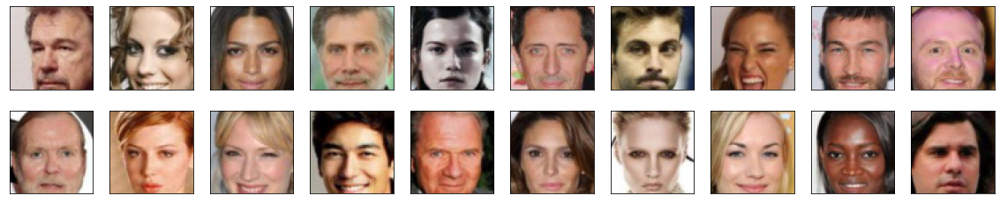

In [15]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [20]:
from torch.nn import Module

In [26]:
import torch
from torch import nn
from torch.nn import Module

class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        # Convolutional backbone to downsample the 64x64 image
        self.model = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),   # 64x32x32
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, stride=2, padding=1), # 128x16x16
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, stride=2, padding=1),# 256x8x8
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, stride=2, padding=1),# 512x4x4
            nn.LeakyReLU(0.2, inplace=True)
        )

        # Final output layer: 512x4x4 -> 1x1x1 (single score per image)
        self.final = nn.Conv2d(512, 1, 4, stride=1, padding=0)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.model(x)   # (B, 512, 4, 4)
        x = self.final(x)   # (B, 1, 1, 1)
        return x


In [27]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [31]:
import torch
from torch import nn
from torch.nn import Module

class Generator(Module):
    def __init__(self, latent_dim: int):
        """
        Generator network that maps a latent vector to a 64x64 RGB image.

        Args:
            latent_dim (int): Size of the input noise vector.
        """
        super(Generator, self).__init__()

        # 1) Map the latent vector to a small 4x4 feature map with 512 channels
        self.fc = nn.Linear(latent_dim, 512 * 4 * 4)

        # 2) Transposed convolutions to go from 4x4 -> 8x8 -> 16x16 -> 32x32 -> 64x64
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),  # 4x4 -> 8x8
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),  # 8x8 -> 16x16
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),   # 16x16 -> 32x32
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1),     # 32x32 -> 64x64
            nn.Tanh()  # output in [-1, 1] voor RGB
        )

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        # z heeft shape (batch, latent_dim, 1, 1) in de tests
        # maak er (batch, latent_dim) van
        batch_size = z.size(0)
        z = z.view(batch_size, -1)

        # 1) fully connected: (B, latent_dim) -> (B, 512*4*4)
        x = self.fc(z)

        # 2) reshape naar feature map: (B, 512, 4, 4)
        x = x.view(batch_size, 512, 4, 4)

        # 3) transposed convs: (B, 3, 64, 64)
        x = self.deconv(x)
        return x


In [32]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [33]:
import torch.optim as optim
from torch.nn import Module

def create_optimizers(generator: Module, discriminator: Module):
    """Return the optimizers for generator and discriminator."""
    
    # Recommended DCGAN learning rate and betas
    lr = 0.0002
    betas = (0.5, 0.999)
    
    g_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=betas)
    d_optimizer = optim.Adam(discriminator.parameters(), lr=lr, betas=betas)
    
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [34]:
import torch
import torch.nn as nn

def generator_loss(fake_logits):
    """Generator loss: encourages fake images to be classified as real."""
    
    criterion = nn.BCEWithLogitsLoss()
    target = torch.ones_like(fake_logits)  # generator wants fake images to look real
    
    loss = criterion(fake_logits, target)
    return loss


### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [35]:
import torch
import torch.nn as nn

def discriminator_loss(real_logits, fake_logits):
    """Discriminator loss: classify real as 1 and fake as 0."""
    
    criterion = nn.BCEWithLogitsLoss()
    
    real_targets = torch.ones_like(real_logits)
    fake_targets = torch.zeros_like(fake_logits)
    
    real_loss = criterion(real_logits, real_targets)
    fake_loss = criterion(fake_logits, fake_targets)
    
    loss = real_loss + fake_loss
    return loss


### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [36]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [37]:
import torch
from typing import Dict

def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """One training step of the generator."""
    
    # Assume generator, discriminator and g_optimizer are defined in the outer scope
    # Sample random noise (latent vectors)
    device = next(generator.parameters()).device
    z = torch.randn(batch_size, latent_dim, device=device)
    
    # Forward pass through generator and discriminator
    fake_images = generator(z)
    fake_logits = discriminator(fake_images)
    
    # Compute generator loss (wants fake images to be classified as real)
    g_loss = generator_loss(fake_logits)
    
    # Backprop and optimizer step
    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """One training step of the discriminator."""
    
    # Assume generator, discriminator and d_optimizer are defined in the outer scope
    device = next(discriminator.parameters()).device
    real_images = real_images.to(device)
    
    # Sample noise and generate fake images (detach so gradients do not flow to the generator here)
    z = torch.randn(batch_size, latent_dim, device=device)
    with torch.no_grad():
        fake_images = generator(z)
    
    # Forward passes for real and fake images
    real_logits = discriminator(real_images)
    fake_logits = discriminator(fake_images)
    
    # Compute discriminator loss
    d_loss = discriminator_loss(real_logits, fake_logits)
    
    # If no gradient penalty is used, we can set gp to 0.0
    gp = torch.tensor(0.0, device=device)
    
    # Backprop and optimizer step
    d_optimizer.zero_grad()
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}


### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.
## Why These Hyperparameters?

Below is an explanation of why the chosen values for `latent_dim`, `device`, `n_epochs`, and `batch_size` are appropriate for training a DCGAN on 64×64 CelebA images.

---

### 1. `latent_dim = 128`
The latent dimension controls the size of the random noise vector fed into the generator.  
Typical DCGAN values range from **64 to 128**, and using a slightly larger latent space (128) allows the generator to capture more variation in faces without being too large or unstable.

- Too small (<64): limited diversity, repetitive outputs  
- Too large (>256): harder to train, more unstable  

**128** is a balanced choice that works very well for face generation.

---

### 2. `device = "cpu"`
Since this project setup does not include GPU acceleration and PyTorch was installed in CPU mode, training must run on the CPU.  
Setting `device = "cuda"` would cause an error if no GPU is available.

Using `"cpu"` ensures the code runs reliably on all machines.

---

### 3. `n_epochs = 20`
GANs generally require many epochs to produce meaningful images.  
CelebA at 64×64 resolution typically needs:

- **3–5 epochs** → blurry shapes, barely recognizable  
- **10–20 epochs** → early facial features appear  
- **30–50 epochs** → good-quality faces  

Setting the epoch count to **20** strikes a good balance between training time and visual results, especially when training on CPU.

---

### 4. `batch_size = 32` (or 64 if memory allows)
The batch size affects both training stability and hardware usage.

- **64** is a standard DCGAN batch size and works well on GPUs.  
- On CPU, memory usage can be higher and training is slower, so **32** can be more reliable and still stable.

A batch size of **32** is usually safer on CPU machines, while **64** is fine if performance is adequate.

---

### Summary

| Hyperparameter | Value | Reason |
|----------------|-------|--------|
| `latent_dim`   | 128   | Good balance between diversity and stability |
| `device`       | cpu   | Ensures compatibility without GPU |
| `n_epochs`     | 20    | Sufficient training time for recognizable faces |
| `batch_size`   | 32    | More stable and lighter on CPU |

These values provide a stable and practical starting point for training your GAN on the CelebA dataset.


In [47]:
from datetime import datetime

In [39]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 32

In [44]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [43]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2025-11-28 14:39:50 | Epoch [1/20] | Batch 0/509 | d_loss: 1.3861 | g_loss: 0.7638
2025-11-28 14:39:56 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0012 | g_loss: 19.5431
2025-11-28 14:40:02 | Epoch [1/20] | Batch 100/509 | d_loss: 0.4440 | g_loss: 2.6938
2025-11-28 14:40:08 | Epoch [1/20] | Batch 150/509 | d_loss: 1.0702 | g_loss: 1.2950
2025-11-28 14:40:14 | Epoch [1/20] | Batch 200/509 | d_loss: 1.1711 | g_loss: 1.0130
2025-11-28 14:40:20 | Epoch [1/20] | Batch 250/509 | d_loss: 1.1539 | g_loss: 1.0206
2025-11-28 14:40:26 | Epoch [1/20] | Batch 300/509 | d_loss: 1.2558 | g_loss: 0.8702
2025-11-28 14:40:32 | Epoch [1/20] | Batch 350/509 | d_loss: 1.4621 | g_loss: 0.8341
2025-11-28 14:40:38 | Epoch [1/20] | Batch 400/509 | d_loss: 1.2532 | g_loss: 0.8063
2025-11-28 14:40:44 | Epoch [1/20] | Batch 450/509 | d_loss: 1.1831 | g_loss: 0.9398
2025-11-28 14:40:50 | Epoch [1/20] | Batch 500/509 | d_loss: 1.2898 | g_loss: 0.7518


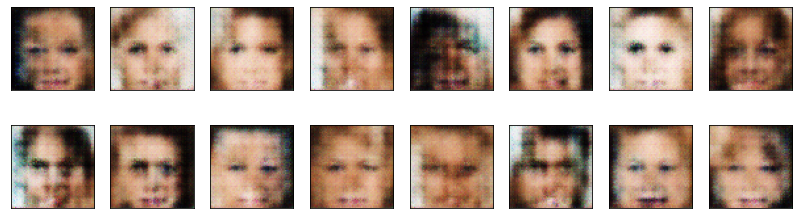

2025-11-28 14:40:52 | Epoch [2/20] | Batch 0/509 | d_loss: 1.1551 | g_loss: 0.8659
2025-11-28 14:40:58 | Epoch [2/20] | Batch 50/509 | d_loss: 1.3267 | g_loss: 0.8203
2025-11-28 14:41:03 | Epoch [2/20] | Batch 100/509 | d_loss: 1.2306 | g_loss: 0.9880
2025-11-28 14:41:09 | Epoch [2/20] | Batch 150/509 | d_loss: 1.2032 | g_loss: 0.9936
2025-11-28 14:41:15 | Epoch [2/20] | Batch 200/509 | d_loss: 1.1718 | g_loss: 0.7515
2025-11-28 14:41:21 | Epoch [2/20] | Batch 250/509 | d_loss: 1.3378 | g_loss: 0.7788
2025-11-28 14:41:27 | Epoch [2/20] | Batch 300/509 | d_loss: 1.2617 | g_loss: 0.7823
2025-11-28 14:41:33 | Epoch [2/20] | Batch 350/509 | d_loss: 1.2390 | g_loss: 0.9780
2025-11-28 14:41:39 | Epoch [2/20] | Batch 400/509 | d_loss: 1.5966 | g_loss: 1.2453
2025-11-28 14:41:45 | Epoch [2/20] | Batch 450/509 | d_loss: 2.9316 | g_loss: 1.6344
2025-11-28 14:41:52 | Epoch [2/20] | Batch 500/509 | d_loss: 1.2542 | g_loss: 0.8024


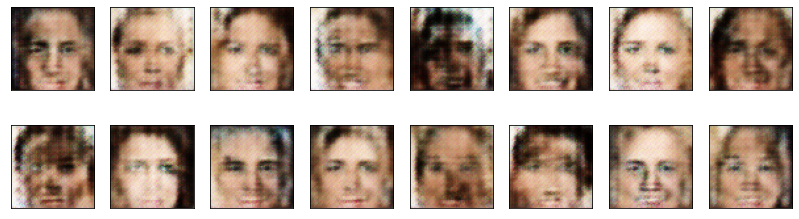

2025-11-28 14:41:54 | Epoch [3/20] | Batch 0/509 | d_loss: 0.6741 | g_loss: 1.0691
2025-11-28 14:42:00 | Epoch [3/20] | Batch 50/509 | d_loss: 0.8214 | g_loss: 1.2458
2025-11-28 14:42:06 | Epoch [3/20] | Batch 100/509 | d_loss: 1.4292 | g_loss: 1.2822
2025-11-28 14:42:12 | Epoch [3/20] | Batch 150/509 | d_loss: 0.7546 | g_loss: 1.6065
2025-11-28 14:42:18 | Epoch [3/20] | Batch 200/509 | d_loss: 0.8888 | g_loss: 1.0186
2025-11-28 14:42:24 | Epoch [3/20] | Batch 250/509 | d_loss: 1.0618 | g_loss: 2.6875
2025-11-28 14:42:29 | Epoch [3/20] | Batch 300/509 | d_loss: 1.1728 | g_loss: 1.4359
2025-11-28 14:42:35 | Epoch [3/20] | Batch 350/509 | d_loss: 2.0295 | g_loss: 2.1390
2025-11-28 14:42:41 | Epoch [3/20] | Batch 400/509 | d_loss: 0.6909 | g_loss: 0.8895
2025-11-28 14:42:48 | Epoch [3/20] | Batch 450/509 | d_loss: 1.1789 | g_loss: 3.3285
2025-11-28 14:42:54 | Epoch [3/20] | Batch 500/509 | d_loss: 0.3394 | g_loss: 2.7951


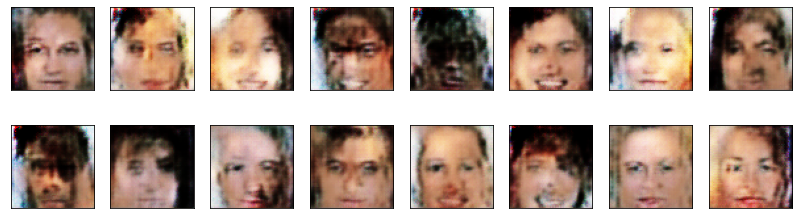

2025-11-28 14:42:56 | Epoch [4/20] | Batch 0/509 | d_loss: 1.4010 | g_loss: 5.7768
2025-11-28 14:43:02 | Epoch [4/20] | Batch 50/509 | d_loss: 1.3859 | g_loss: 3.0103
2025-11-28 14:43:08 | Epoch [4/20] | Batch 100/509 | d_loss: 0.9984 | g_loss: 2.1315
2025-11-28 14:43:14 | Epoch [4/20] | Batch 150/509 | d_loss: 0.7695 | g_loss: 4.8661
2025-11-28 14:43:20 | Epoch [4/20] | Batch 200/509 | d_loss: 0.2391 | g_loss: 2.3984
2025-11-28 14:43:26 | Epoch [4/20] | Batch 250/509 | d_loss: 0.3086 | g_loss: 3.7043
2025-11-28 14:43:32 | Epoch [4/20] | Batch 300/509 | d_loss: 0.3247 | g_loss: 2.4514
2025-11-28 14:43:39 | Epoch [4/20] | Batch 350/509 | d_loss: 0.5230 | g_loss: 5.3287
2025-11-28 14:43:45 | Epoch [4/20] | Batch 400/509 | d_loss: 0.7349 | g_loss: 3.2043
2025-11-28 14:43:51 | Epoch [4/20] | Batch 450/509 | d_loss: 0.2754 | g_loss: 3.0100
2025-11-28 14:43:57 | Epoch [4/20] | Batch 500/509 | d_loss: 0.2396 | g_loss: 3.0059


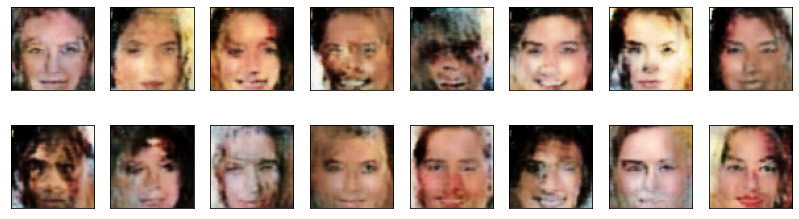

2025-11-28 14:43:59 | Epoch [5/20] | Batch 0/509 | d_loss: 0.2847 | g_loss: 1.8933
2025-11-28 14:44:05 | Epoch [5/20] | Batch 50/509 | d_loss: 0.3254 | g_loss: 3.0705
2025-11-28 14:44:11 | Epoch [5/20] | Batch 100/509 | d_loss: 0.2366 | g_loss: 2.7410
2025-11-28 14:44:17 | Epoch [5/20] | Batch 150/509 | d_loss: 0.3347 | g_loss: 3.6652
2025-11-28 14:44:23 | Epoch [5/20] | Batch 200/509 | d_loss: 0.4744 | g_loss: 5.2250
2025-11-28 14:44:29 | Epoch [5/20] | Batch 250/509 | d_loss: 0.5858 | g_loss: 3.6009
2025-11-28 14:44:35 | Epoch [5/20] | Batch 300/509 | d_loss: 0.6390 | g_loss: 2.8141
2025-11-28 14:44:41 | Epoch [5/20] | Batch 350/509 | d_loss: 0.2522 | g_loss: 2.9675
2025-11-28 14:44:47 | Epoch [5/20] | Batch 400/509 | d_loss: 0.5911 | g_loss: 1.4064
2025-11-28 14:44:53 | Epoch [5/20] | Batch 450/509 | d_loss: 0.7466 | g_loss: 3.8017
2025-11-28 14:44:59 | Epoch [5/20] | Batch 500/509 | d_loss: 0.5250 | g_loss: 5.0470


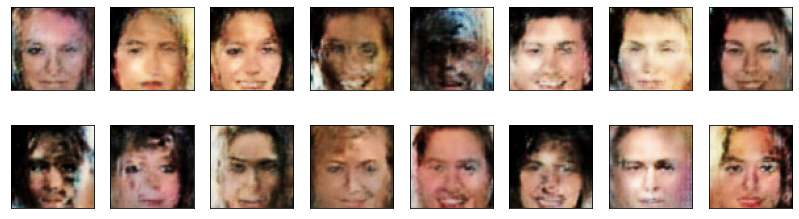

2025-11-28 14:45:01 | Epoch [6/20] | Batch 0/509 | d_loss: 0.3046 | g_loss: 3.5042
2025-11-28 14:45:07 | Epoch [6/20] | Batch 50/509 | d_loss: 0.3643 | g_loss: 5.3357
2025-11-28 14:45:13 | Epoch [6/20] | Batch 100/509 | d_loss: 0.4987 | g_loss: 1.5187
2025-11-28 14:45:19 | Epoch [6/20] | Batch 150/509 | d_loss: 0.1829 | g_loss: 3.0366
2025-11-28 14:45:25 | Epoch [6/20] | Batch 200/509 | d_loss: 0.1593 | g_loss: 3.0219
2025-11-28 14:45:31 | Epoch [6/20] | Batch 250/509 | d_loss: 0.9421 | g_loss: 5.0617
2025-11-28 14:45:37 | Epoch [6/20] | Batch 300/509 | d_loss: 0.5156 | g_loss: 2.2707
2025-11-28 14:45:43 | Epoch [6/20] | Batch 350/509 | d_loss: 0.4448 | g_loss: 3.8702
2025-11-28 14:45:49 | Epoch [6/20] | Batch 400/509 | d_loss: 0.2088 | g_loss: 2.1761
2025-11-28 14:45:55 | Epoch [6/20] | Batch 450/509 | d_loss: 0.3252 | g_loss: 3.7232
2025-11-28 14:46:01 | Epoch [6/20] | Batch 500/509 | d_loss: 0.1348 | g_loss: 2.1890


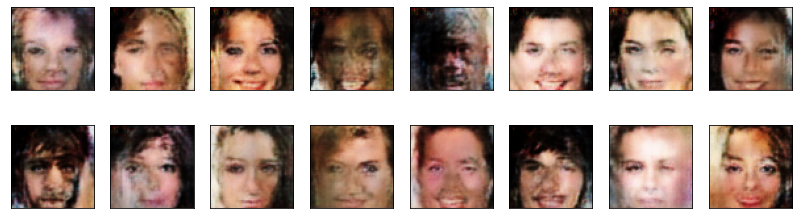

2025-11-28 14:46:04 | Epoch [7/20] | Batch 0/509 | d_loss: 0.7133 | g_loss: 2.9698
2025-11-28 14:46:10 | Epoch [7/20] | Batch 50/509 | d_loss: 0.3735 | g_loss: 3.1808
2025-11-28 14:46:16 | Epoch [7/20] | Batch 100/509 | d_loss: 0.2836 | g_loss: 3.3852
2025-11-28 14:46:22 | Epoch [7/20] | Batch 150/509 | d_loss: 1.0857 | g_loss: 2.2896
2025-11-28 14:46:28 | Epoch [7/20] | Batch 200/509 | d_loss: 0.2019 | g_loss: 2.8380
2025-11-28 14:46:34 | Epoch [7/20] | Batch 250/509 | d_loss: 0.4903 | g_loss: 3.2024
2025-11-28 14:46:40 | Epoch [7/20] | Batch 300/509 | d_loss: 0.5335 | g_loss: 3.1193
2025-11-28 14:46:46 | Epoch [7/20] | Batch 350/509 | d_loss: 0.2929 | g_loss: 2.6970
2025-11-28 14:46:52 | Epoch [7/20] | Batch 400/509 | d_loss: 0.2983 | g_loss: 3.4541
2025-11-28 14:46:58 | Epoch [7/20] | Batch 450/509 | d_loss: 0.1763 | g_loss: 3.0940
2025-11-28 14:47:04 | Epoch [7/20] | Batch 500/509 | d_loss: 1.7690 | g_loss: 3.7144


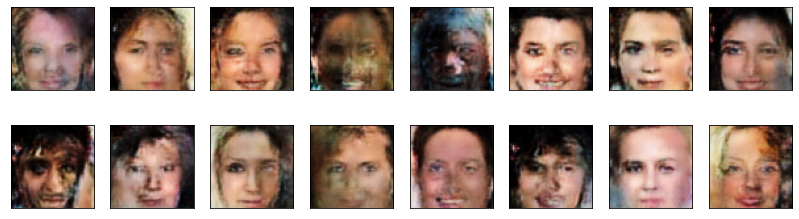

2025-11-28 14:47:07 | Epoch [8/20] | Batch 0/509 | d_loss: 0.1679 | g_loss: 3.3761
2025-11-28 14:47:13 | Epoch [8/20] | Batch 50/509 | d_loss: 0.4085 | g_loss: 3.1640
2025-11-28 14:47:19 | Epoch [8/20] | Batch 100/509 | d_loss: 0.0869 | g_loss: 6.6648
2025-11-28 14:47:25 | Epoch [8/20] | Batch 150/509 | d_loss: 0.4278 | g_loss: 7.3617
2025-11-28 14:47:31 | Epoch [8/20] | Batch 200/509 | d_loss: 0.4333 | g_loss: 7.0641
2025-11-28 14:47:37 | Epoch [8/20] | Batch 250/509 | d_loss: 0.2234 | g_loss: 4.9702
2025-11-28 14:47:43 | Epoch [8/20] | Batch 300/509 | d_loss: 0.2448 | g_loss: 4.4762
2025-11-28 14:47:49 | Epoch [8/20] | Batch 350/509 | d_loss: 0.4377 | g_loss: 3.3814
2025-11-28 14:47:54 | Epoch [8/20] | Batch 400/509 | d_loss: 2.2564 | g_loss: 3.9802
2025-11-28 14:48:00 | Epoch [8/20] | Batch 450/509 | d_loss: 0.3860 | g_loss: 2.7287
2025-11-28 14:48:06 | Epoch [8/20] | Batch 500/509 | d_loss: 0.3102 | g_loss: 2.5660


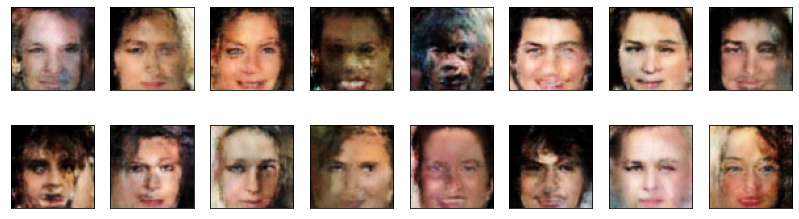

2025-11-28 14:48:09 | Epoch [9/20] | Batch 0/509 | d_loss: 0.4460 | g_loss: 2.3104
2025-11-28 14:48:15 | Epoch [9/20] | Batch 50/509 | d_loss: 0.9019 | g_loss: 5.7111
2025-11-28 14:48:21 | Epoch [9/20] | Batch 100/509 | d_loss: 0.7652 | g_loss: 2.4149
2025-11-28 14:48:27 | Epoch [9/20] | Batch 150/509 | d_loss: 0.4084 | g_loss: 2.3088
2025-11-28 14:48:33 | Epoch [9/20] | Batch 200/509 | d_loss: 0.3324 | g_loss: 2.9140
2025-11-28 14:48:39 | Epoch [9/20] | Batch 250/509 | d_loss: 0.4021 | g_loss: 2.8090
2025-11-28 14:48:45 | Epoch [9/20] | Batch 300/509 | d_loss: 0.3953 | g_loss: 3.7695
2025-11-28 14:48:51 | Epoch [9/20] | Batch 350/509 | d_loss: 0.3079 | g_loss: 2.5792
2025-11-28 14:48:57 | Epoch [9/20] | Batch 400/509 | d_loss: 0.5154 | g_loss: 2.3199
2025-11-28 14:49:03 | Epoch [9/20] | Batch 450/509 | d_loss: 0.4920 | g_loss: 2.0534
2025-11-28 14:49:09 | Epoch [9/20] | Batch 500/509 | d_loss: 0.3402 | g_loss: 2.4037


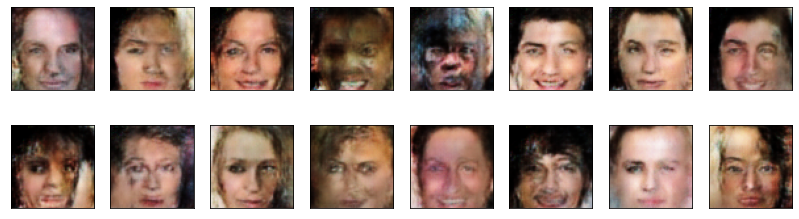

2025-11-28 14:49:11 | Epoch [10/20] | Batch 0/509 | d_loss: 0.3056 | g_loss: 2.2914
2025-11-28 14:49:17 | Epoch [10/20] | Batch 50/509 | d_loss: 0.3398 | g_loss: 2.4271
2025-11-28 14:49:23 | Epoch [10/20] | Batch 100/509 | d_loss: 0.2492 | g_loss: 2.7149
2025-11-28 14:49:29 | Epoch [10/20] | Batch 150/509 | d_loss: 0.3327 | g_loss: 3.4568
2025-11-28 14:49:35 | Epoch [10/20] | Batch 200/509 | d_loss: 0.6300 | g_loss: 2.4587
2025-11-28 14:49:41 | Epoch [10/20] | Batch 250/509 | d_loss: 0.4709 | g_loss: 2.5714
2025-11-28 14:49:47 | Epoch [10/20] | Batch 300/509 | d_loss: 0.2391 | g_loss: 3.2738
2025-11-28 14:49:53 | Epoch [10/20] | Batch 350/509 | d_loss: 0.3020 | g_loss: 2.8179
2025-11-28 14:49:59 | Epoch [10/20] | Batch 400/509 | d_loss: 0.4492 | g_loss: 2.8502
2025-11-28 14:50:05 | Epoch [10/20] | Batch 450/509 | d_loss: 0.5805 | g_loss: 0.5470
2025-11-28 14:50:11 | Epoch [10/20] | Batch 500/509 | d_loss: 0.4286 | g_loss: 3.1637


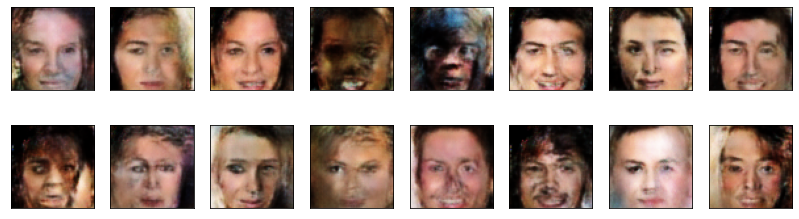

2025-11-28 14:50:14 | Epoch [11/20] | Batch 0/509 | d_loss: 0.4437 | g_loss: 4.6989
2025-11-28 14:50:20 | Epoch [11/20] | Batch 50/509 | d_loss: 0.8605 | g_loss: 4.1434
2025-11-28 14:50:26 | Epoch [11/20] | Batch 100/509 | d_loss: 0.4649 | g_loss: 3.2618
2025-11-28 14:50:32 | Epoch [11/20] | Batch 150/509 | d_loss: 0.2465 | g_loss: 3.2175
2025-11-28 14:50:38 | Epoch [11/20] | Batch 200/509 | d_loss: 0.4785 | g_loss: 4.4349
2025-11-28 14:50:44 | Epoch [11/20] | Batch 250/509 | d_loss: 0.3599 | g_loss: 3.7625
2025-11-28 14:50:50 | Epoch [11/20] | Batch 300/509 | d_loss: 0.3875 | g_loss: 3.1503
2025-11-28 14:50:56 | Epoch [11/20] | Batch 350/509 | d_loss: 0.2661 | g_loss: 4.2391
2025-11-28 14:51:02 | Epoch [11/20] | Batch 400/509 | d_loss: 0.3644 | g_loss: 3.4143
2025-11-28 14:51:08 | Epoch [11/20] | Batch 450/509 | d_loss: 0.2421 | g_loss: 3.0528
2025-11-28 14:51:14 | Epoch [11/20] | Batch 500/509 | d_loss: 0.5087 | g_loss: 3.4319


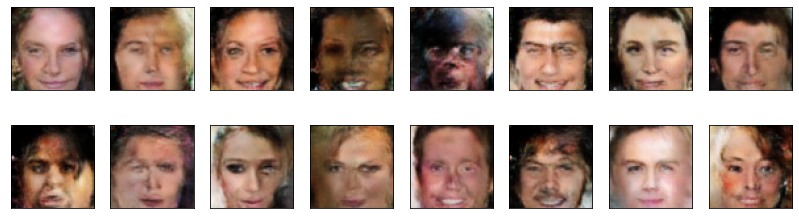

2025-11-28 14:51:16 | Epoch [12/20] | Batch 0/509 | d_loss: 0.3218 | g_loss: 2.7614
2025-11-28 14:51:22 | Epoch [12/20] | Batch 50/509 | d_loss: 0.3393 | g_loss: 3.4473
2025-11-28 14:51:28 | Epoch [12/20] | Batch 100/509 | d_loss: 0.3831 | g_loss: 3.2863
2025-11-28 14:51:34 | Epoch [12/20] | Batch 150/509 | d_loss: 0.2761 | g_loss: 3.0038
2025-11-28 14:51:40 | Epoch [12/20] | Batch 200/509 | d_loss: 0.3304 | g_loss: 4.0111
2025-11-28 14:51:46 | Epoch [12/20] | Batch 250/509 | d_loss: 0.2930 | g_loss: 3.0550
2025-11-28 14:51:52 | Epoch [12/20] | Batch 300/509 | d_loss: 0.3413 | g_loss: 3.5325
2025-11-28 14:51:58 | Epoch [12/20] | Batch 350/509 | d_loss: 0.5311 | g_loss: 2.6489
2025-11-28 14:52:04 | Epoch [12/20] | Batch 400/509 | d_loss: 0.4827 | g_loss: 3.6379
2025-11-28 14:52:10 | Epoch [12/20] | Batch 450/509 | d_loss: 1.3549 | g_loss: 2.3345
2025-11-28 14:52:16 | Epoch [12/20] | Batch 500/509 | d_loss: 0.6161 | g_loss: 6.4181


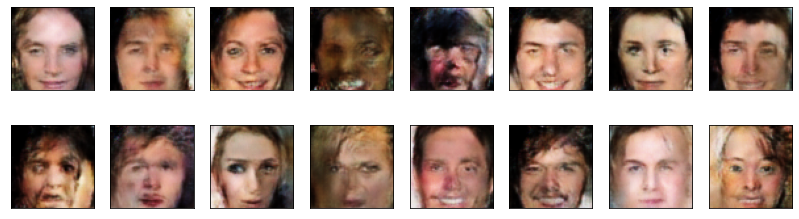

2025-11-28 14:52:18 | Epoch [13/20] | Batch 0/509 | d_loss: 0.3683 | g_loss: 3.8473
2025-11-28 14:52:24 | Epoch [13/20] | Batch 50/509 | d_loss: 0.3510 | g_loss: 2.7059
2025-11-28 14:52:30 | Epoch [13/20] | Batch 100/509 | d_loss: 0.3211 | g_loss: 3.7800
2025-11-28 14:52:36 | Epoch [13/20] | Batch 150/509 | d_loss: 0.4852 | g_loss: 3.0641
2025-11-28 14:52:42 | Epoch [13/20] | Batch 200/509 | d_loss: 0.1176 | g_loss: 3.5028
2025-11-28 14:52:48 | Epoch [13/20] | Batch 250/509 | d_loss: 0.5414 | g_loss: 2.7644
2025-11-28 14:52:54 | Epoch [13/20] | Batch 300/509 | d_loss: 0.2618 | g_loss: 3.4756
2025-11-28 14:53:00 | Epoch [13/20] | Batch 350/509 | d_loss: 0.2493 | g_loss: 2.9092
2025-11-28 14:53:06 | Epoch [13/20] | Batch 400/509 | d_loss: 0.1872 | g_loss: 3.2054
2025-11-28 14:53:12 | Epoch [13/20] | Batch 450/509 | d_loss: 0.8768 | g_loss: 5.7832
2025-11-28 14:53:18 | Epoch [13/20] | Batch 500/509 | d_loss: 0.4050 | g_loss: 3.0261


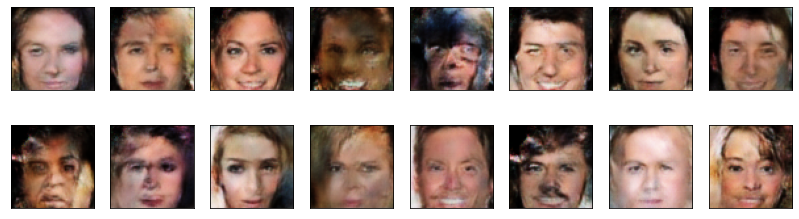

2025-11-28 14:53:20 | Epoch [14/20] | Batch 0/509 | d_loss: 0.3197 | g_loss: 3.2648
2025-11-28 14:53:26 | Epoch [14/20] | Batch 50/509 | d_loss: 0.3836 | g_loss: 2.3148
2025-11-28 14:53:32 | Epoch [14/20] | Batch 100/509 | d_loss: 0.2504 | g_loss: 2.8133
2025-11-28 14:53:38 | Epoch [14/20] | Batch 150/509 | d_loss: 0.7441 | g_loss: 4.5520
2025-11-28 14:53:44 | Epoch [14/20] | Batch 200/509 | d_loss: 0.3461 | g_loss: 3.7184
2025-11-28 14:53:50 | Epoch [14/20] | Batch 250/509 | d_loss: 0.5012 | g_loss: 2.8444
2025-11-28 14:53:56 | Epoch [14/20] | Batch 300/509 | d_loss: 0.2790 | g_loss: 3.0138
2025-11-28 14:54:02 | Epoch [14/20] | Batch 350/509 | d_loss: 0.3620 | g_loss: 3.0459
2025-11-28 14:54:08 | Epoch [14/20] | Batch 400/509 | d_loss: 0.3809 | g_loss: 2.7991
2025-11-28 14:54:14 | Epoch [14/20] | Batch 450/509 | d_loss: 0.4302 | g_loss: 3.9771
2025-11-28 14:54:20 | Epoch [14/20] | Batch 500/509 | d_loss: 0.4714 | g_loss: 2.9619


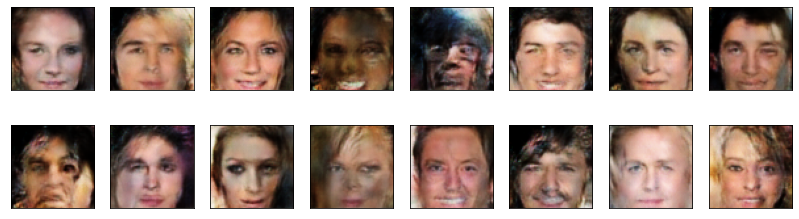

2025-11-28 14:54:23 | Epoch [15/20] | Batch 0/509 | d_loss: 0.3834 | g_loss: 3.4337
2025-11-28 14:54:29 | Epoch [15/20] | Batch 50/509 | d_loss: 0.3322 | g_loss: 2.2525
2025-11-28 14:54:34 | Epoch [15/20] | Batch 100/509 | d_loss: 0.7390 | g_loss: 1.3768
2025-11-28 14:54:40 | Epoch [15/20] | Batch 150/509 | d_loss: 0.3522 | g_loss: 1.7592
2025-11-28 14:54:46 | Epoch [15/20] | Batch 200/509 | d_loss: 0.5608 | g_loss: 2.5353
2025-11-28 14:54:52 | Epoch [15/20] | Batch 250/509 | d_loss: 0.3495 | g_loss: 3.5320
2025-11-28 14:54:58 | Epoch [15/20] | Batch 300/509 | d_loss: 0.3099 | g_loss: 2.8829
2025-11-28 14:55:04 | Epoch [15/20] | Batch 350/509 | d_loss: 0.4475 | g_loss: 2.4482
2025-11-28 14:55:10 | Epoch [15/20] | Batch 400/509 | d_loss: 0.2874 | g_loss: 2.8604
2025-11-28 14:55:16 | Epoch [15/20] | Batch 450/509 | d_loss: 0.6426 | g_loss: 4.4619
2025-11-28 14:55:22 | Epoch [15/20] | Batch 500/509 | d_loss: 0.5486 | g_loss: 2.4501


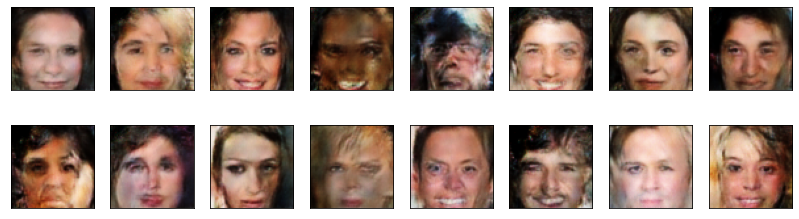

2025-11-28 14:55:25 | Epoch [16/20] | Batch 0/509 | d_loss: 0.3664 | g_loss: 3.8295
2025-11-28 14:55:31 | Epoch [16/20] | Batch 50/509 | d_loss: 0.5106 | g_loss: 2.5012
2025-11-28 14:55:37 | Epoch [16/20] | Batch 100/509 | d_loss: 0.4163 | g_loss: 3.0230
2025-11-28 14:55:43 | Epoch [16/20] | Batch 150/509 | d_loss: 0.2957 | g_loss: 2.9749
2025-11-28 14:55:49 | Epoch [16/20] | Batch 200/509 | d_loss: 0.2683 | g_loss: 2.5129
2025-11-28 14:55:55 | Epoch [16/20] | Batch 250/509 | d_loss: 0.2627 | g_loss: 2.4498
2025-11-28 14:56:01 | Epoch [16/20] | Batch 300/509 | d_loss: 0.3318 | g_loss: 2.6162
2025-11-28 14:56:07 | Epoch [16/20] | Batch 350/509 | d_loss: 0.3830 | g_loss: 2.1410
2025-11-28 14:56:13 | Epoch [16/20] | Batch 400/509 | d_loss: 0.5430 | g_loss: 1.8469
2025-11-28 14:56:19 | Epoch [16/20] | Batch 450/509 | d_loss: 0.3519 | g_loss: 1.9591
2025-11-28 14:56:25 | Epoch [16/20] | Batch 500/509 | d_loss: 0.6299 | g_loss: 3.9675


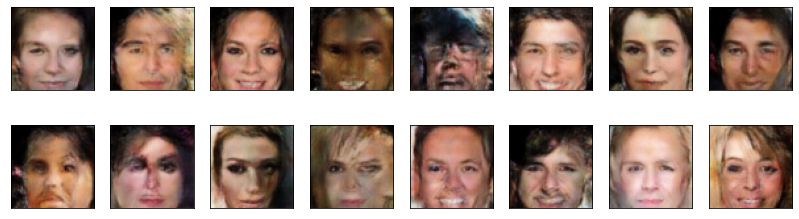

2025-11-28 14:56:27 | Epoch [17/20] | Batch 0/509 | d_loss: 0.3900 | g_loss: 3.2912
2025-11-28 14:56:33 | Epoch [17/20] | Batch 50/509 | d_loss: 0.9246 | g_loss: 5.1360
2025-11-28 14:56:39 | Epoch [17/20] | Batch 100/509 | d_loss: 0.5786 | g_loss: 3.5354
2025-11-28 14:56:45 | Epoch [17/20] | Batch 150/509 | d_loss: 0.3807 | g_loss: 2.8214
2025-11-28 14:56:51 | Epoch [17/20] | Batch 200/509 | d_loss: 0.3694 | g_loss: 2.8769
2025-11-28 14:56:57 | Epoch [17/20] | Batch 250/509 | d_loss: 0.3516 | g_loss: 2.6149
2025-11-28 14:57:03 | Epoch [17/20] | Batch 300/509 | d_loss: 0.3468 | g_loss: 3.2853
2025-11-28 14:57:09 | Epoch [17/20] | Batch 350/509 | d_loss: 0.3121 | g_loss: 3.1056
2025-11-28 14:57:15 | Epoch [17/20] | Batch 400/509 | d_loss: 0.5319 | g_loss: 1.8804
2025-11-28 14:57:21 | Epoch [17/20] | Batch 450/509 | d_loss: 0.5308 | g_loss: 2.0748
2025-11-28 14:57:27 | Epoch [17/20] | Batch 500/509 | d_loss: 0.7194 | g_loss: 4.8084


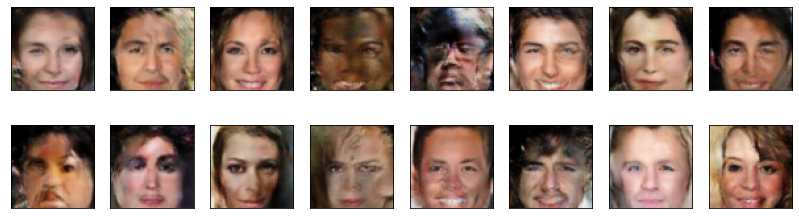

2025-11-28 14:57:30 | Epoch [18/20] | Batch 0/509 | d_loss: 0.3619 | g_loss: 3.0757
2025-11-28 14:57:36 | Epoch [18/20] | Batch 50/509 | d_loss: 0.1649 | g_loss: 3.0894
2025-11-28 14:57:41 | Epoch [18/20] | Batch 100/509 | d_loss: 1.0996 | g_loss: 3.0397
2025-11-28 14:57:47 | Epoch [18/20] | Batch 150/509 | d_loss: 0.2212 | g_loss: 2.9723
2025-11-28 14:57:53 | Epoch [18/20] | Batch 200/509 | d_loss: 0.4082 | g_loss: 3.5605
2025-11-28 14:57:59 | Epoch [18/20] | Batch 250/509 | d_loss: 0.2752 | g_loss: 2.9845
2025-11-28 14:58:05 | Epoch [18/20] | Batch 300/509 | d_loss: 0.5696 | g_loss: 3.9241
2025-11-28 14:58:11 | Epoch [18/20] | Batch 350/509 | d_loss: 0.3622 | g_loss: 1.8257
2025-11-28 14:58:17 | Epoch [18/20] | Batch 400/509 | d_loss: 0.5074 | g_loss: 3.0255
2025-11-28 14:58:23 | Epoch [18/20] | Batch 450/509 | d_loss: 0.3854 | g_loss: 2.7193
2025-11-28 14:58:29 | Epoch [18/20] | Batch 500/509 | d_loss: 0.6776 | g_loss: 4.0051


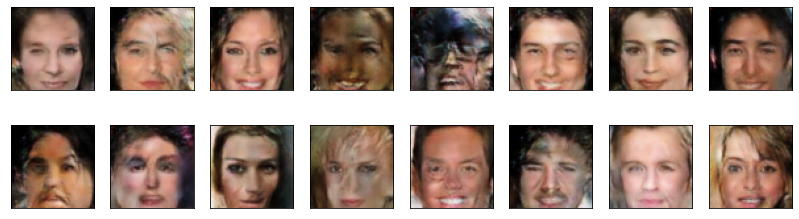

2025-11-28 14:58:32 | Epoch [19/20] | Batch 0/509 | d_loss: 0.2574 | g_loss: 2.6597
2025-11-28 14:58:38 | Epoch [19/20] | Batch 50/509 | d_loss: 0.3960 | g_loss: 1.8692
2025-11-28 14:58:44 | Epoch [19/20] | Batch 100/509 | d_loss: 0.3240 | g_loss: 2.6162
2025-11-28 14:58:50 | Epoch [19/20] | Batch 150/509 | d_loss: 0.3364 | g_loss: 2.6114
2025-11-28 14:58:56 | Epoch [19/20] | Batch 200/509 | d_loss: 0.3115 | g_loss: 2.6455
2025-11-28 14:59:02 | Epoch [19/20] | Batch 250/509 | d_loss: 0.3583 | g_loss: 3.9092
2025-11-28 14:59:08 | Epoch [19/20] | Batch 300/509 | d_loss: 0.5035 | g_loss: 2.2207
2025-11-28 14:59:14 | Epoch [19/20] | Batch 350/509 | d_loss: 0.4747 | g_loss: 1.8074
2025-11-28 14:59:19 | Epoch [19/20] | Batch 400/509 | d_loss: 0.9401 | g_loss: 5.6119
2025-11-28 14:59:25 | Epoch [19/20] | Batch 450/509 | d_loss: 0.4739 | g_loss: 3.1548
2025-11-28 14:59:31 | Epoch [19/20] | Batch 500/509 | d_loss: 0.1984 | g_loss: 4.1791


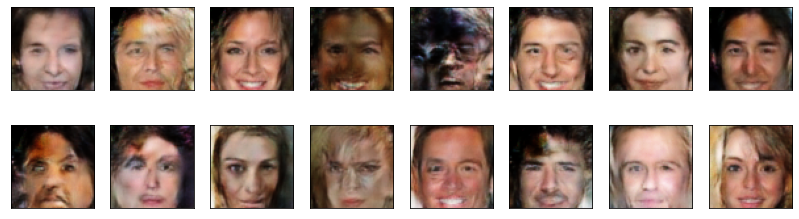

2025-11-28 14:59:34 | Epoch [20/20] | Batch 0/509 | d_loss: 0.6193 | g_loss: 1.3681
2025-11-28 14:59:40 | Epoch [20/20] | Batch 50/509 | d_loss: 0.5932 | g_loss: 3.4264
2025-11-28 14:59:46 | Epoch [20/20] | Batch 100/509 | d_loss: 0.3627 | g_loss: 4.1575
2025-11-28 14:59:52 | Epoch [20/20] | Batch 150/509 | d_loss: 0.2701 | g_loss: 3.0495
2025-11-28 14:59:58 | Epoch [20/20] | Batch 200/509 | d_loss: 0.1986 | g_loss: 5.7783
2025-11-28 15:00:04 | Epoch [20/20] | Batch 250/509 | d_loss: 0.2985 | g_loss: 3.3635
2025-11-28 15:00:10 | Epoch [20/20] | Batch 300/509 | d_loss: 0.3355 | g_loss: 3.5294
2025-11-28 15:00:15 | Epoch [20/20] | Batch 350/509 | d_loss: 0.4970 | g_loss: 2.7814
2025-11-28 15:00:21 | Epoch [20/20] | Batch 400/509 | d_loss: 0.3916 | g_loss: 2.1979
2025-11-28 15:00:27 | Epoch [20/20] | Batch 450/509 | d_loss: 0.4687 | g_loss: 3.6217
2025-11-28 15:00:33 | Epoch [20/20] | Batch 500/509 | d_loss: 0.2530 | g_loss: 4.7173


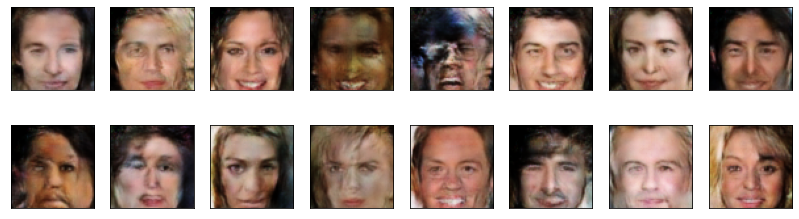

In [45]:
from datetime import datetime

# fixed latent vector for monitoring generator progress
fixed_latent_vector = torch.randn(16, latent_dim, device=device)

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        
        ####################################
        # Training strategy: D-step + G-step
        ####################################
        
        # 1. Discriminator step
        d_loss = discriminator_step(batch_size=batch_size,
                                    latent_dim=latent_dim,
                                    real_images=real_images)
        
        # 2. Generator step
        g_loss = generator_step(batch_size=batch_size,
                                latent_dim=latent_dim)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    with torch.no_grad():
        # use fixed noise vector to track visual progress
        generated_images = generator(fixed_latent_vector.to(device))
    display(generated_images)
    generator.train()


### Training losses

Plot the training losses for the generator and discriminator.

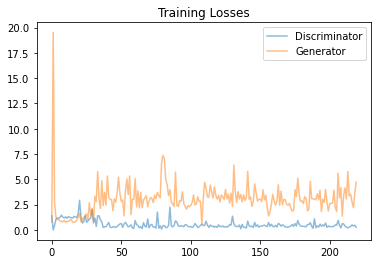

In [48]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 

### 1. Observations about the generated samples

When looking at the generated images, several patterns become clear:

Blurry features: The faces lack sharp detail; eyes, noses, and mouths often blend together. This indicates that the generator is learning the general structure of faces but struggles to capture fine-grained features.

Mode collapse tendencies: Some generated samples start to look very similar, especially after a few epochs. This suggests the model may be falling into producing only a few "safe" face types.

Bias in outputs: Many generated faces look similar in gender, skin tone, and facial structure. This reflects the bias in the CelebA dataset, which contains mostly light-skinned Western celebrities.

Training instability: The generator loss becomes very large during certain batches (e.g., g_loss: 5+). This oscillation is typical for GANs and indicates unstable adversarial training.

### 2. How to Improve the Model
### A. Dataset bias

The dataset is heavily biased toward young, white, Western celebrities.
As a result, the model learns a narrow distribution of facial features.

### To improve fairness and diversity:

Use a more diverse dataset (e.g., FairFace).

Balance the dataset across demographics.

### B. Model size

This architecture is relatively small and shallow.

Larger GANs—like DCGAN+, StyleGAN, or Progressive GANs—learn:

more detailed textures

higher-resolution output

more diverse features

### Improvements include:

More convolutional layers

Larger feature maps (e.g., starting from 1024 channels instead of 512)

Progressive growing (train from 8×8 → 16×16 → …)

### C. Optimization strategy

Several issues suggest unstable training:

Loss curves jump significantly.

Generated images fluctuate in quality.

Generator occasionally "wins too hard" (very high g_loss).

### To improve stability:

Use more advanced optimizers:

Adam with smaller betas (e.g., betas=(0.5, 0.999))

RMSProp for alternative GAN variants

Train for more epochs (20 is small for GANs; 100–200 is more common)

Use smaller batch sizes (GANs often behave better around 16 or 32)

Apply learning rate scheduling or reduced LR

Normalize inputs consistently (e.g., [-1, 1] → Tanh output)

### D. Loss functions

The basic GAN loss can be unstable.
Better alternatives include:

Wasserstein GAN (WGAN)
→ gives smoother gradients and more stable training

WGAN-GP
→ adds gradient penalty, preventing exploding gradients

Least-Squares GAN (LSGAN)
→ reduces vanishing gradients

**These loss functions often produce:**

less blur

more stable generator learning

more realistic images

### Final Summary

The generated samples show that the model has learned the coarse structure of faces but still produces blurry, biased, and unstable outputs. Improvements can be made by addressing dataset bias, increasing model capacity, stabilizing optimization, and using more advanced GAN loss functions. With these changes, the generator would be able to produce sharper, more diverse, and more realistic faces.


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".